---
# ***Predicción de closing prices implementando una arquitectura LSTM en Tensorflow / Keras***
---
<p style="text-align:right"><i>Otoniel Ruiz Morales<br>Junio 2025</i></p>

## Sobre este Notebook
---
Notebook realizado por **Otoniel Ruiz Morales** como parte del curso **Machine Learning**

periodo Enero - Junio 2025

- Versión 1.0 del regresor utilizado para el proyecto "***Deep Reinforcement Learning for Asset Allocation under Stochastic Market Dynamics***"

- **Resumen:**

El *forecasting* o predicción de series de tiempo es un área de investigación activa desde hace décadas, impulsada por la necesidad de anticipar valores futuros en campos como la economía, la ingeniería y las ciencias.

A partir de los años 80/90 las redes neuronales comenzaron a utilizarse en dicha area, dada su capacidad de modelar relaciones tanto lineales como no lineales sin requerir un conocimiento previo exhaustivo del fenómeno a modelar.

Las redes ***Long-Short Term Memory (LSTM)*** son una iteración de las arquitecturas *Recurrent Neural Network (RNN)* diseñadas y optimizadas para la tarea en cuestión.
Representan una solución al problema del *vanishing gradient* presente en la etapa de entrenamiento de las redes recurrentes, dónde los gradientes utilizados para actualizar los pesos se tornan extremadamente pequeños o "*desaparecen*".

Como mencionamos anteriormente algunas de sus principales aplicaciones se encuentran dentro de la economia, en una rama conocida como *econometría*.

En nuestro caso utilizamos una configuración ***Vector-Ouput Stacked LSTM***  para predecir el valor de "*Closing Price*" de una colección de acciones en distintas ventanas temporales.

- **Índice**

1. Extracción de las series temporales

2. Preprocesamiento

3. Configuración de las ventanas de tiempo

4. Configuración del modelo

5. Resultados


In [1]:
import IPython
from sys import version
import os

import numpy as np
from numpy import array
import matplotlib.pyplot as plt
import yfinance as yf
import pandas as pd

import tensorflow as tf
import sklearn as skl
import scipy as spy

print (' Condiciones de reproductibilidad '.center(85,'-'))
print ('Python version:       ' + version)
print ('IPython version:      ' + IPython.__version__)
print ('Numpy version:        ' + np.__version__)
print ('Yfinance version:     ' + yf.__version__)
print ('Pandas version:       ' + pd.__version__)
print ('Tensorflow version:   ' + tf.__version__)
print ('Sklearn version:      ' + skl.__version__)
print ('Scipy version:        ' + spy.__version__)
print ('-'*85)

-------------------------- Condiciones de reproductibilidad -------------------------
Python version:       3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]
IPython version:      7.34.0
Numpy version:        2.0.2
Yfinance version:     0.2.61
Pandas version:       2.2.2
Tensorflow version:   2.18.0
Sklearn version:      1.6.1
Scipy version:        1.15.3
-------------------------------------------------------------------------------------


In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector, TimeDistributed
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr

In [3]:
def split_sequence(sequence, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequence)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(sequence):
            break
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

## 1. Extracción de las series temporales

A traves de la libreria yFinance extraemos los valores historicos diarios de 10 acciones pertencientes al *National Association of Securities Dealers Automated Quotations (NASDAQ)* del primero de Enero de 2005 al primero de Enero de 2025

Los valores de cada acción quedan guardados como un *dataframe* de pandas y este es agregado a la lista *dataFrames*


In [4]:
tickers = ["AAPL", "AMZN", "NFLX", "MSFT", "NVDA",
           "EBAY", "CSCO", "INTC", "SIRI","ILMN"]
dataFrames = []

for ticker in tickers:
    data = yf.download(tickers=ticker, start="2005-01-01", end="2025-01-01")
    df = pd.DataFrame(data)
    dataFrames.append(df)
print(f"\n\nAlgunos valores de AAPL: \n{dataFrames[0].head(10)}")

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed



Algunos valores de AAPL: 
Price          Close      High       Low      Open      Volume
Ticker          AAPL      AAPL      AAPL      AAPL        AAPL
Date                                                          
2005-01-03  0.951065  0.978414  0.940696  0.973455   691992000
2005-01-04  0.960833  0.983824  0.946256  0.958578  1096810400
2005-01-05  0.969248  0.980518  0.962485  0.968646   680433600
2005-01-06  0.969999  0.975409  0.951666  0.971802   705555200
2005-01-07  1.040626  1.046337  0.973004  0.976761  2227450400
2005-01-10  1.036269  1.062416  1.020040  1.049342  1725309600
2005-01-11  0.970149  1.039124  0.963838  1.025600  2611627200
2005-01-12  0.983674  0.990286  0.951215  0.983523  1919702400
2005-01-13  1.048891  1.118317  1.047840  1.107647  3164716800
2005-01-14  1.054902  1.077743  1.039725  1.055653  1770742400


## 2. Preprocesamiento

Primeramente indicamos una normalización a la columna *Close* en un rango de -1 a 1 para acotar los valores extremos

In [5]:
scaler = MinMaxScaler(feature_range=(-1, 1))

Agregaremos tres columnas a cada dataframe correspondientes a las tres medias móviles más usadas en el análisis técnico:

1. **Media Móvil Simple (SMA)**

Corresponde al promedio aritmético de un número fijo de puntos consecutivos, es útil para suavizar curvas con exceso de fluctuaciones o ruido, y para corroborar tendencias.
$$\text{SMA}_t = \frac{1}{k} \sum_{i = t - k + 1}^{t} x_i$$
- $k$: Tamaño de la ventana (número de datos sobre los que se promedia)
- $x_i$: Valores contenidos en la ventana

2. **Media Móvil Ponderada (WMA)**

Variante de la media móvil simple en la que se asignan pesos diferentes a los valores dependiendo su antiguedad, de modo que los datos más nuevos tienen mayor influencia en el promedio que los más viejos.

$$\text{WMA}_t = \frac{\sum_{i=0}^{k-1} w_i \cdot x_{t - i}}{\sum_{i=0}^{k-1} w_i}$$

- $x_{t - i}$: Valor de la serie temporal en el tiempo $t - i$.
- $w_i$: Peso asignado al dato $x_{t - i}$, con $w_0$ siendo el peso más reciente.
- $k$: Tamaño de la ventana.


3. **Media Móvil Exponencial (EMA)**

Variante de la media móvil ponderada, no requiere de una ventana fija para calcularse, enfatisa los datos mas recientes y genera una curva mas suave y menos ruidosa que su antecesora

$$\text{EMA}_t = \alpha \cdot x_t + (1 - \alpha) \cdot \text{EMA}_{t - 1}$$

- $\alpha$: Factor de suavizado, $0 < \alpha < 1$, que controla el "peso" de los datos más recientes.
- $\text{EMA}_{t-1}$: EMA del periodo anterior.


In [6]:
WMA_weights = np.linspace(0.1, 1, 1000)
WMA_window  = 1000
WMA_sum_weigths = np.sum(WMA_weights)

In [7]:
for df in dataFrames:
    df["Close"] = scaler.fit_transform(df[["Close"]])
    df["WMA"] = (df["Close"].rolling(window=WMA_window, center=True)
                            .apply(lambda x: np.sum(WMA_weights * x) / WMA_sum_weigths))
    df["SMA"] = df["Close"].rolling(window=WMA_window).mean()
    df["EMA"] = df["Close"].ewm(span=WMA_window).mean()


print(f"\n\nAlgunos valores de AAPL despues del preprocesamiento: \n{dataFrames[0].head(10)}")



Algunos valores de AAPL despues del preprocesamiento: 
Price          Close      High       Low      Open      Volume WMA SMA  \
Ticker          AAPL      AAPL      AAPL      AAPL        AAPL           
Date                                                                     
2005-01-03 -1.000000  0.978414  0.940696  0.973455   691992000 NaN NaN   
2005-01-04 -0.999924  0.983824  0.946256  0.958578  1096810400 NaN NaN   
2005-01-05 -0.999859  0.980518  0.962485  0.968646   680433600 NaN NaN   
2005-01-06 -0.999853  0.975409  0.951666  0.971802   705555200 NaN NaN   
2005-01-07 -0.999304  1.046337  0.973004  0.976761  2227450400 NaN NaN   
2005-01-10 -0.999338  1.062416  1.020040  1.049342  1725309600 NaN NaN   
2005-01-11 -0.999852  1.039124  0.963838  1.025600  2611627200 NaN NaN   
2005-01-12 -0.999747  0.990286  0.951215  0.983523  1919702400 NaN NaN   
2005-01-13 -0.999240  1.118317  1.047840  1.107647  3164716800 NaN NaN   
2005-01-14 -0.999193  1.077743  1.039725  1.055653  177

## 3. Configuración de las ventanas de tiempo

La predicción se realiza alimentando al modelo con un intervalo determinado de valores y en base a ellos devolver una aproximación de aquellos que les suceden en la serie de tiempo.

Para ello se definen distintos puntos de referencia a lo largo de la serie a partir de los cuales se cuentan los intervalos usados para entrenamiento (en base a los cuales se hará la predicción) y prueba (los que se predecirán).

Cada dataframe contiene un total de 5033 valores de closing price, por lo que se utilizaran los siguientes pasos de referencia y ventanas.

In [8]:
time_steps  = [0, 1000, 2000, 2800]

#Configuraciones ventana entrada/salida: (n_steps_in, n_steps_out)
window_configs = [
    (1000, 100),
    (100, 10),
    (10, 2)
]

Cada ventana se compone de dos valores: n_steps_in y n_steps_out, el primero indica la cantidad de valores que utilizaremos para realizar cada predicción y el segundo la cantidad de valores que predeciremos a partir de los anteriores

**Ejemplo:**

time_step   = 0 |
n_steps_in  = 1000 |
n_steps_out = 100


A partir del valor con **índice 0** se usarán los siguientes 1000 (**[0:999]**) para predecir los 100 posteriores a estos (**[1000:1100]**)

## 4. Configuración del modelo

El modelo propuesto corresponde a una ***Vector-Ouput Stacked LSTM***, cuyo nombre se puede diseccionar en las siguientes partes:

***Vector-Output*** hace referencia a que la red devolverá un vector de predicciones en lugar de un único valor.

***Stacked*** denota que se trata de una arquitectura con múltiples capas de neuronas LSTM, las cuales fungen como la "memoria" del modelo.

En nuestro caso particular contamos con **dos** capas ocultas compuestas de **100** neuronas LSTM cada una, unidas a una ***Fully Conected Layer*** que devuelve el vector de predicciones

In [9]:
# model = Sequential()
# model.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(n_steps_in, 1)))
# model.add(LSTM(100, activation='tanh'))
# model.add(Dense(n_steps_out, activation='tanh'))
# model.compile(optimizer='adam', loss='mse')

Como función de activación utilizamos la tangente hiperbólica dado que devuelve valores entre -1 y 1, manteniendo paridad con la normalización usada.
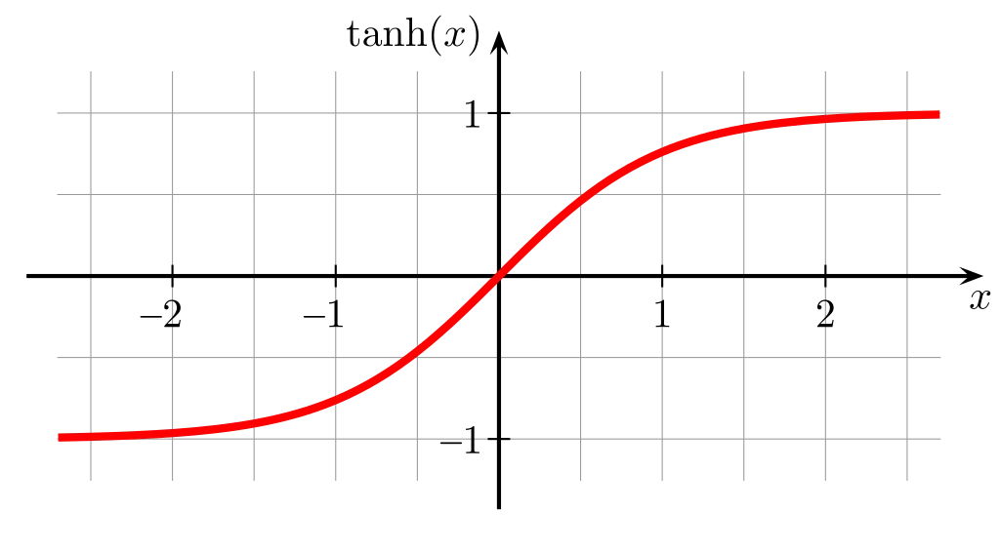

La función de perdida considerada corresponde al *Mean Squared Error*, la más utilizada en regresiones, mide el promedio de los errores al cuadrado, es decir, la diferencia entre la predicción y el valor real que buscamos:

Si ${\displaystyle {\hat {Y}}}$ es un vector de n predicciones y
${\displaystyle Y}$ es el vector de valores reales, entonces el (estimado) error cuadrático medio del predictor es:
$${\displaystyle \operatorname {ECM} ={\frac {1}{n}}\sum _{i=1}^{n}(Y_{i}-{\hat {Y_{i}}})^{2}}$$

el objetivo de la red es minimizar dicha función.

## 5. Resultados

Realizaremos dos predicciones por cada ventana indicada anteriormente, una utilizando los valores usados en el entrenamiento y otra en base a datos separados correspondientes al testeo para comparar los ajustes

El siguiente script muestra los intervalos que el modelo utilizara dependiendo de los parámetros time_step, n_steps_in y n_steps_out


In [10]:
for n_steps_in, n_steps_out in window_configs:
  for time_step in time_steps:
    start_test = time_step + n_steps_in + n_steps_out
    end_test = start_test + n_steps_in
    print(f"Time step = {time_step} - Ventana = {(n_steps_in, n_steps_out)}")
    print(f"Rango de X_train: {time_step} -> {time_step + n_steps_in - 1}")
    print(f"Rango de y_train: {time_step + n_steps_in} -> {time_step + n_steps_in + n_steps_out - 1}")
    print(f"Rango de X_test: {start_test} -> {end_test - 1}")
    print(f"Rango de y_test: {end_test} -> {end_test + n_steps_out}")
    print()


Time step = 0 - Ventana = (1000, 100)
Rango de X_train: 0 -> 999
Rango de y_train: 1000 -> 1099
Rango de X_test: 1100 -> 2099
Rango de y_test: 2100 -> 2200

Time step = 1000 - Ventana = (1000, 100)
Rango de X_train: 1000 -> 1999
Rango de y_train: 2000 -> 2099
Rango de X_test: 2100 -> 3099
Rango de y_test: 3100 -> 3200

Time step = 2000 - Ventana = (1000, 100)
Rango de X_train: 2000 -> 2999
Rango de y_train: 3000 -> 3099
Rango de X_test: 3100 -> 4099
Rango de y_test: 4100 -> 4200

Time step = 2800 - Ventana = (1000, 100)
Rango de X_train: 2800 -> 3799
Rango de y_train: 3800 -> 3899
Rango de X_test: 3900 -> 4899
Rango de y_test: 4900 -> 5000

Time step = 0 - Ventana = (100, 10)
Rango de X_train: 0 -> 99
Rango de y_train: 100 -> 109
Rango de X_test: 110 -> 209
Rango de y_test: 210 -> 220

Time step = 1000 - Ventana = (100, 10)
Rango de X_train: 1000 -> 1099
Rango de y_train: 1100 -> 1109
Rango de X_test: 1110 -> 1209
Rango de y_test: 1210 -> 1220

Time step = 2000 - Ventana = (100, 10)
Ra

En cada imagen se mostrarán dos graficas: las predicciones tanto de y_train como de y_test junto a los valores reales correspondientes.

Se consideraron 3 métricas para cuantificar el desempeño del modelo:
1. **Raíz del error cuadrático medio (RSME)**

Métrica de *precisión* que mide la diferencia entre los valores predichos por un modelo y los valores reales, **siempre es positiva** y entre más cercano sea
al cero, mejor es el ajuste

Viene dado por la ecuacion:
$$\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$$

- $y_i$ es el valor real.
- $\hat{y}_i$ es el valor predicho por el modelo.
- $n$ es el número total de observaciones.

2. **Coeficiente de determinación ($R^{2}$)**

Coeficiente que determina la calidad del modelo para replicar los resultados, mide la proporción de la variabilidad de la variable dependiente que es explicada por el modelo:

$$R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$$

- $R^2 = 1$: Explica toda la variabilidad de los datos observados. La predicción es perfecta.
- $R^2 = 0$: No explica ninguna variabilidad de los datos. Su desempeño es  como predecir la media de los valores reales.
- $R^2 < 0$: El modelo es peor que una predicción basada en la media.

Cuanto más cercano a 1 sea el valor de $R^2$, mejor será el ajuste.


3. **Coeficiente de correlación de Spearman (PCC)**
El coeficiente de Spearman $r_s$ mide la fuerza y la dirección de una relación monótona entre dos variables. Su valor está en el rango de $-1$ a $1$, y viene dado por:

$$r_s = 1 - \frac{6 \sum d_i^2}{n(n^2 - 1)}$$
- $d_i$ = $\text{rango}(x_i)$ - $\text{rango}(y_i)$
- $n$: número de observaciones

Se interpreta de la siguiente forma:

- $r_s = 1$: Correlación monótona positiva perfecta. A medida que una variable aumenta, la otra también lo hace de manera consistente.
- $r_s = -1$: Correlación monótona negativa perfecta. A medida que una variable aumenta, la otra disminuye de manera consistente.
- $r_s = 0$: No hay correlación monótona.

En el siguiente bloque se debe agregar el path a la carpeta dónde se guardarán las imágenes

In [11]:
#Ruta de la carpeta
folder_path = '/content/drive/MyDrive/Prueba 01'

#Crear la carpeta si no existe
os.makedirs(folder_path, exist_ok=True)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9919
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.9580
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.9284
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8957
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8548
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.7998
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7238
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6259
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.5218
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.4307
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3571
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2973
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2454
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1990
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1583
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/st

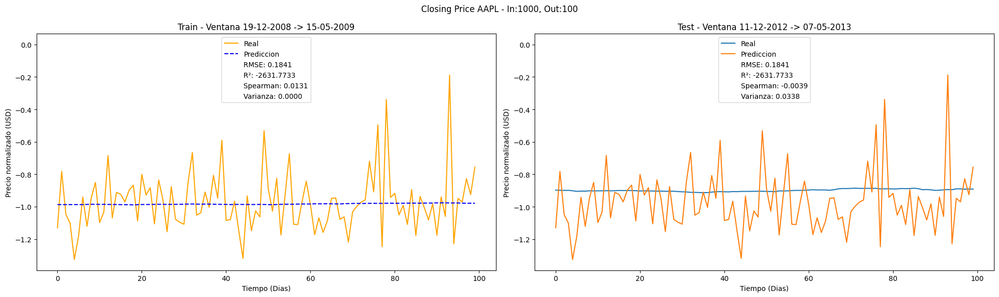

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8163
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7866
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7579
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.7254
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6841
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6278
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.5506
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4536
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3546
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2788
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2314
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1978
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1669
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1368
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1086
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/st

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


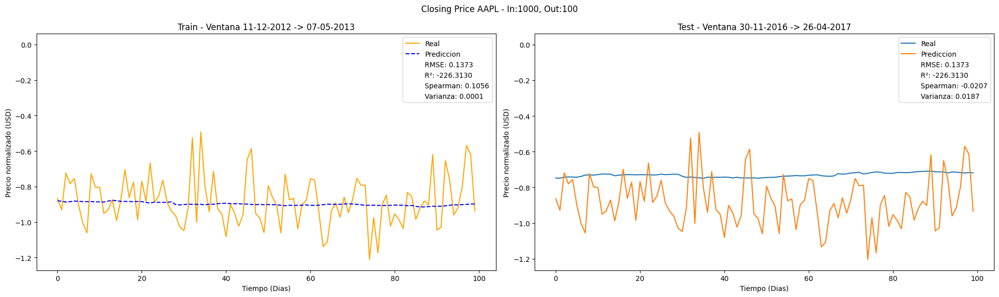

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6090
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.5872
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.5663
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.5422
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.5110
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4681
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4087
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3353
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.2688
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2298
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2041
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1747
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1428
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1130
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0880
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/st

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


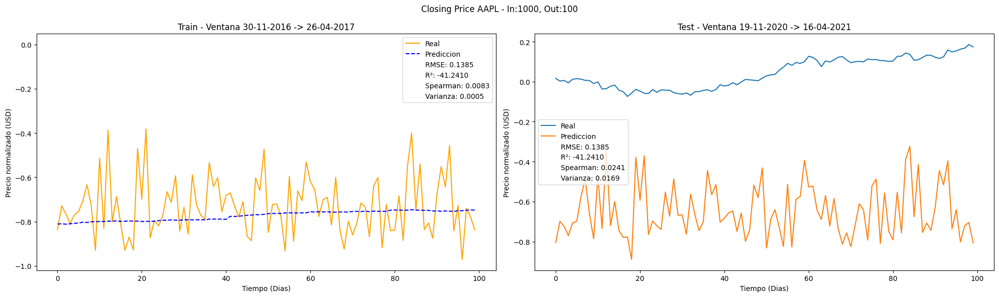

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.2020
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1932
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1831
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1696
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1502
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1243
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.1043
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0945
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0753
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0546
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0403
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0316
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0248
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0188
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0145
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/st

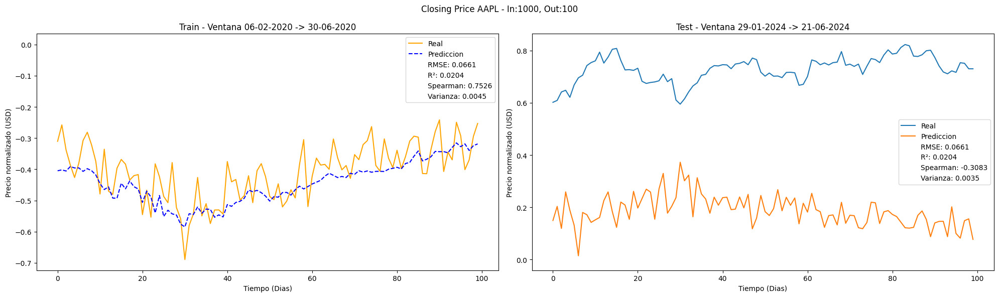

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9841
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.8382
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6969
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5446
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3779
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2195
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1279
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1177
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1052
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0679
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0331
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0178
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0200
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0286
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0343
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

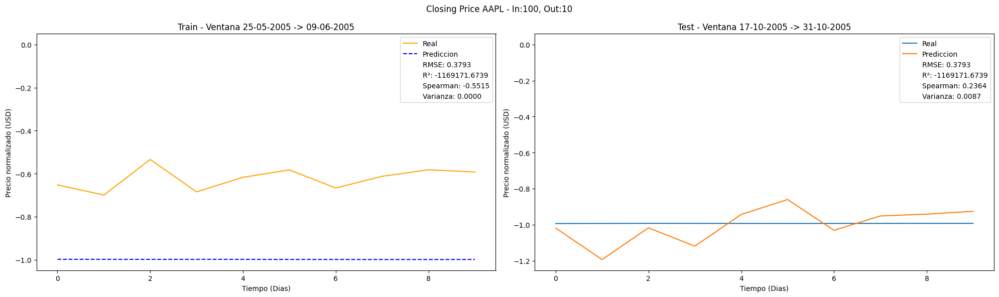

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9550
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.8318
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.7087
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5751
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4228
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.2606
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1454
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1243
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1039
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0628
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0347
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0299
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0359
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0390
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0354
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

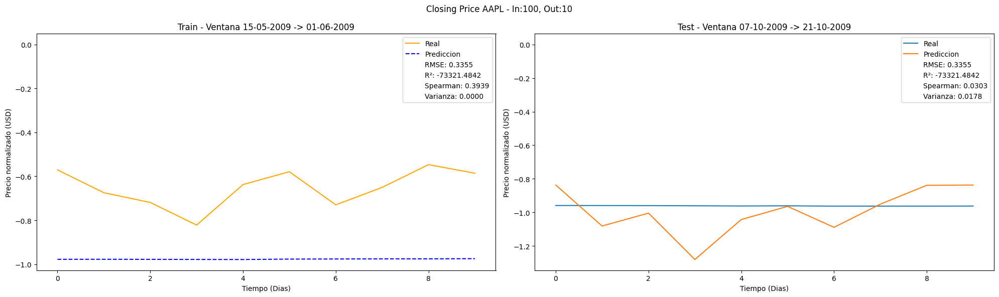

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7845
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.6812
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5744
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4512
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3050
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1519
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0690
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1080
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0949
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0450
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0171
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0186
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0300
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0371
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0365
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

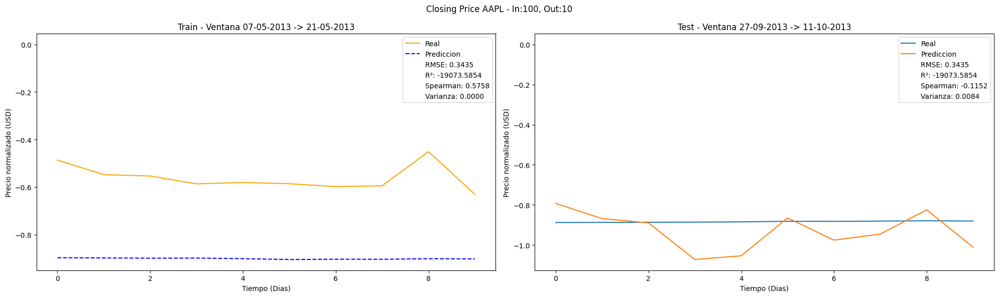

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6847
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5891
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.4987
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4015
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2893
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1641
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0650
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0737
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0907
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0603
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0245
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0138
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0243
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0311
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

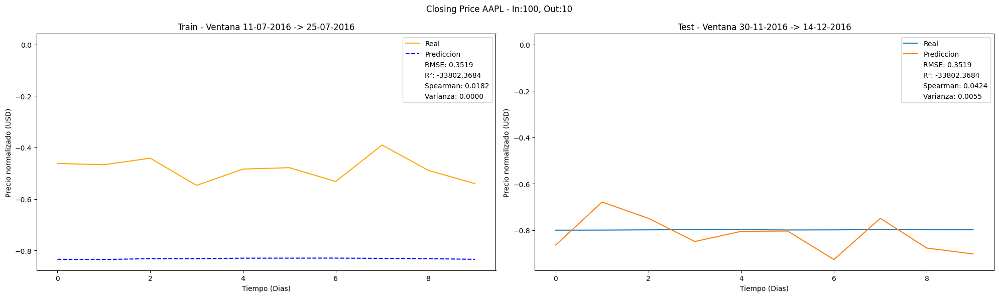

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9833
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.8369
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6947
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5517
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4063
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2604
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1247
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0252
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0103
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0970
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1487
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1195
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0621
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0193
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0030
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

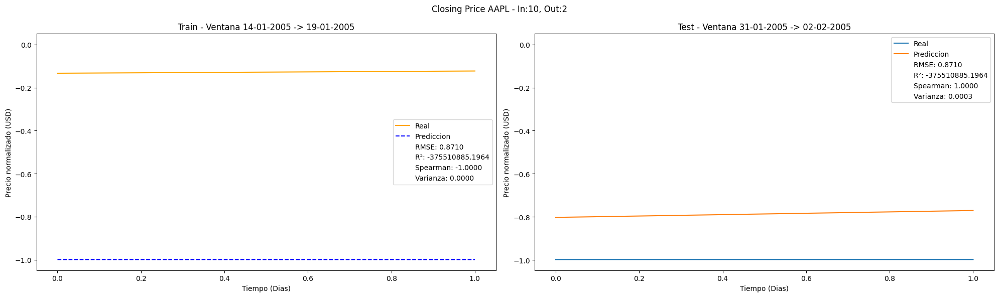

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9888
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.8136
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.6471
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4838
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3251
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1792
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0661
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0194
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0605
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1145
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1104
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0714
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0349
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0171
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0160
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

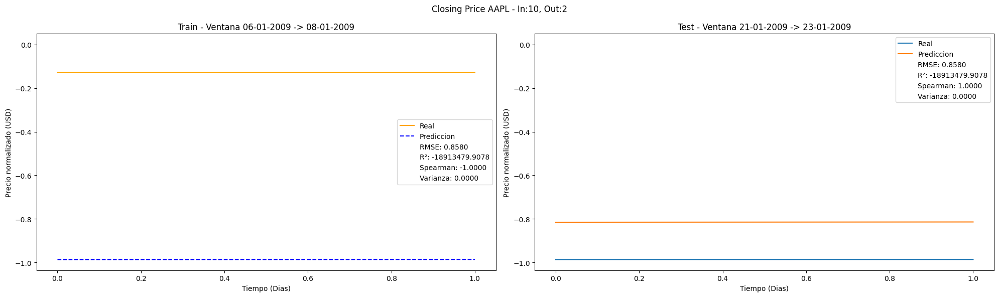

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7586
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.6117
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4731
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3389
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2101
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0961
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0183
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0116
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0753
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1090
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0861
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0454
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0161
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0052
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0076
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

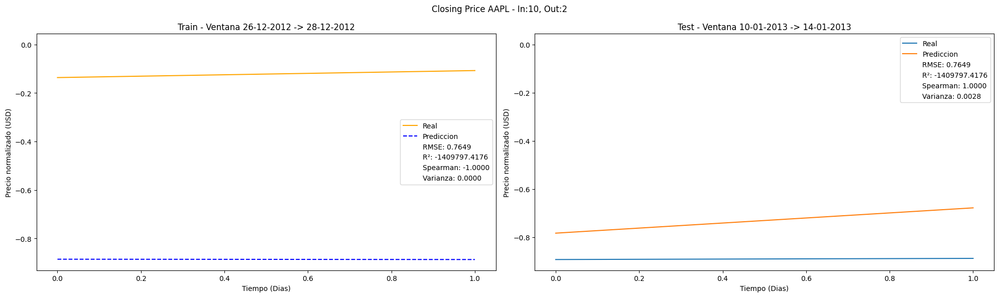

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6339
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5112
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.4001
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2961
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1980
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1097
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0422
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0145
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0392
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0741
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0724
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0453
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0187
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0059
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0064
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/st

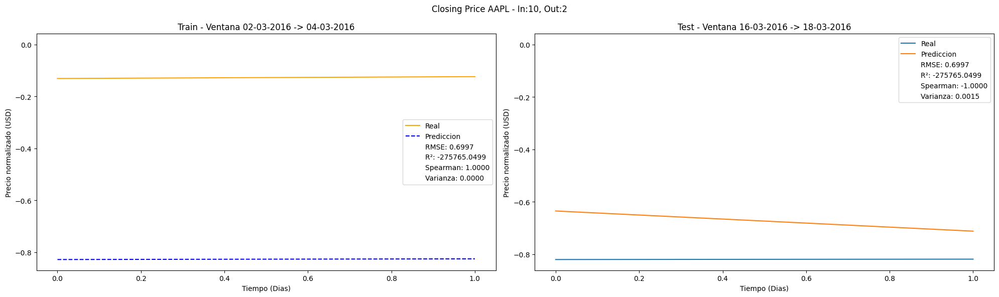

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9736
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.9339
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.8925
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8412
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.7706
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6721
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5494
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.4278
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3336
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2691
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2221
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1834
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1496
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1198
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0935
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/st

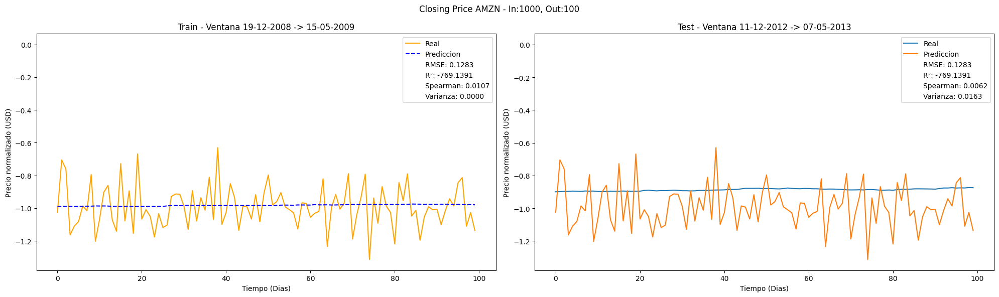

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7973
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.7603
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.7232
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.6778
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6166
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.5333
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4304
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.3306
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2620
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2226
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1903
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1579
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1266
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0985
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0749
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/st

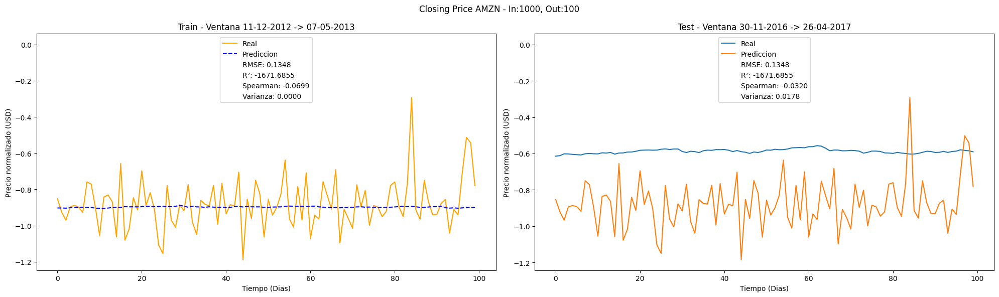

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4317
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.4167
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4007
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3810
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3547
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.3185
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2709
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2190
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1798
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1573
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1347
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1068
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0802
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0597
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0455
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

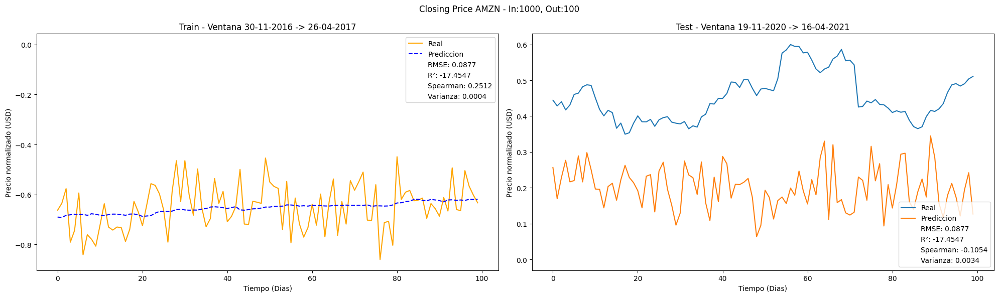

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0171
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0157
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0142
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0124
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0103
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0079
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0062
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0059
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0039
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0026
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0021
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0018
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0014
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 9.7473e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 8.7377e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

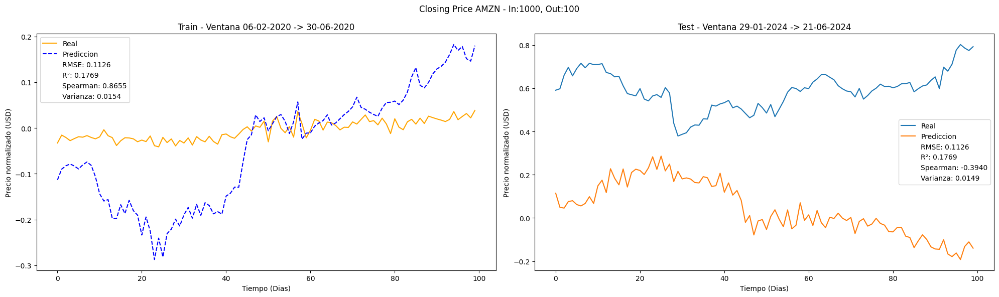

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0110
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.8817
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.7525
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6069
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.4373
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2577
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1346
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1144
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1054
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0717
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0389
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0267
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0330
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0433
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0465
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/st

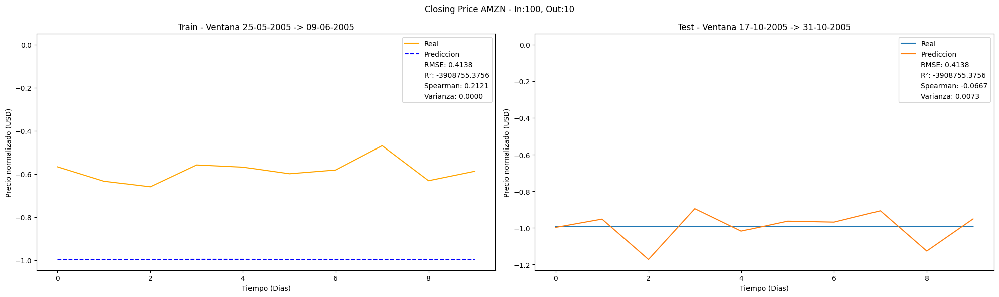

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9099
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.7787
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6411
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.4852
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.3105
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1552
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1086
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1245
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0921
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0408
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0126
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0158
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0328
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0444
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0444
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/st

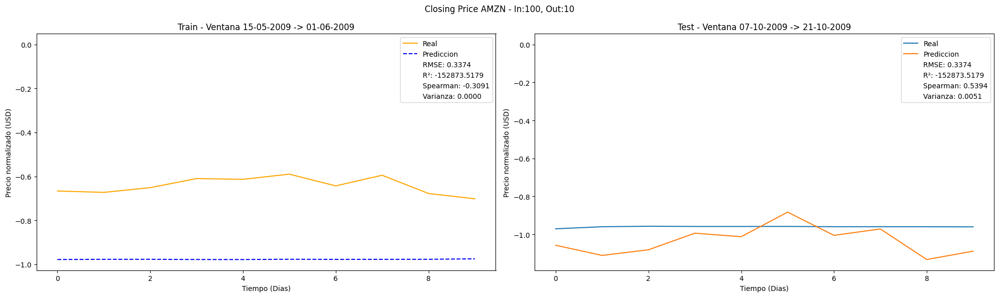

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7745
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.6578
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.5416
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.4120
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2643
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1184
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0588
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1104
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0961
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0437
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0102
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0211
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0331
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0369
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

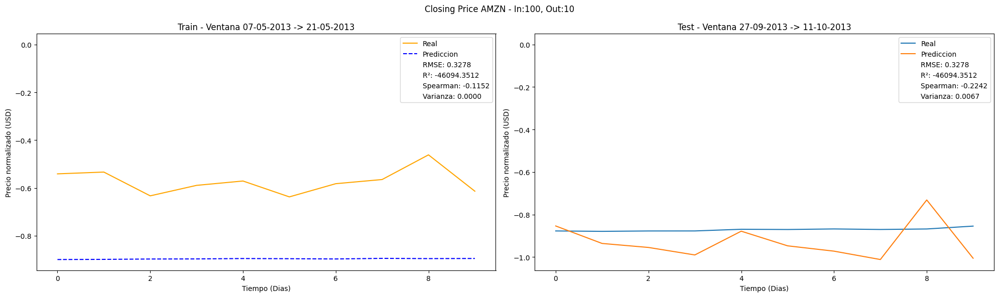

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4866
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4229
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3610
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2946
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2177
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.1297
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0537
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0573
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0643
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0376
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0150
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0102
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0161
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0222
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0237
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

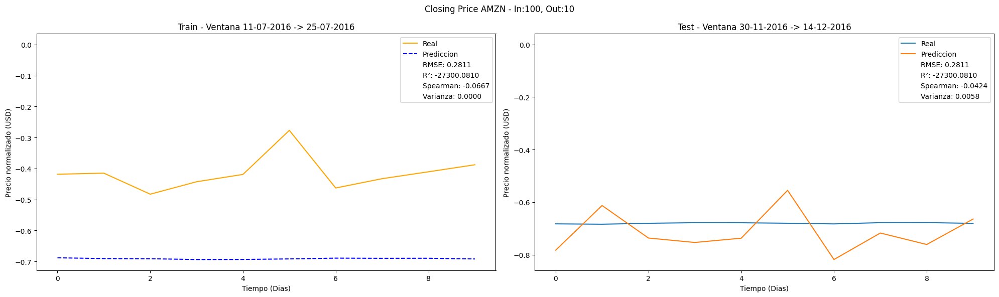

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8850
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.6964
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5235
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3611
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2100
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0820
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0060
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0274
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1135
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1311
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0874
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0365
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0013
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

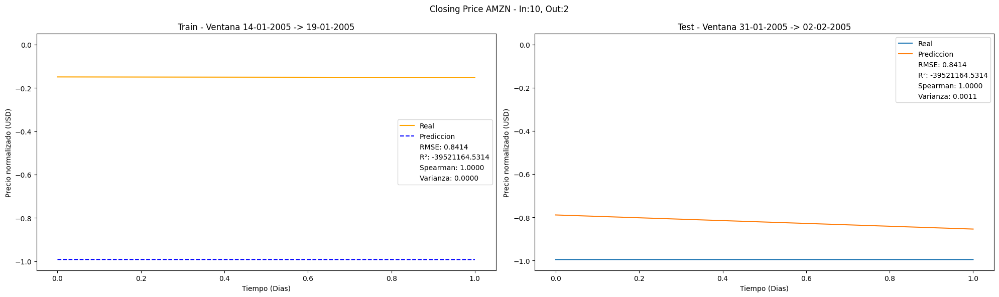

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9736
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.8132
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.6589
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5057
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3538
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2099
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0915
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0307
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0512
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0992
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1040
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0748
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0446
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0292
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0271
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

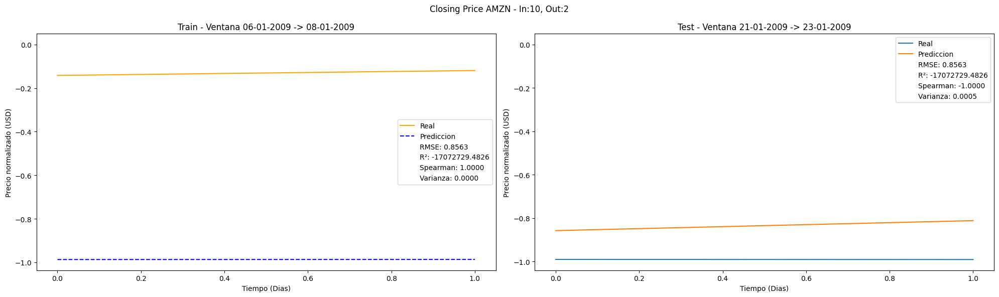

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8482
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.6910
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5464
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4088
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2770
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1548
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0552
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0051
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0355
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1000
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1076
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0705
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0303
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0086
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0059
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/st

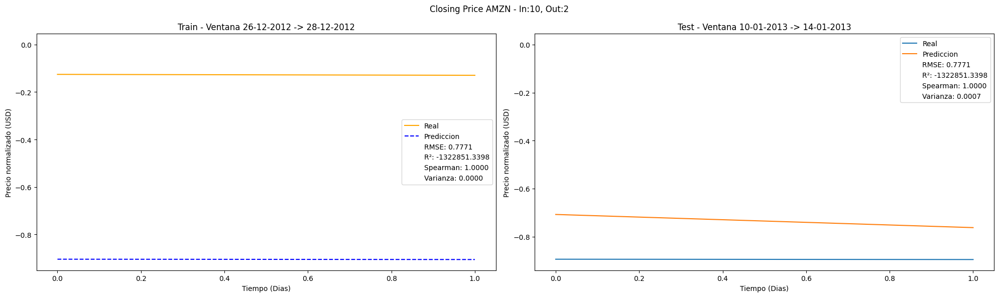

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5390
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.4279
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.3228
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.2220
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1281
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0494
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0037
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0176
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0694
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0802
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0538
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0226
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0044
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 9.6999e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0067
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45m

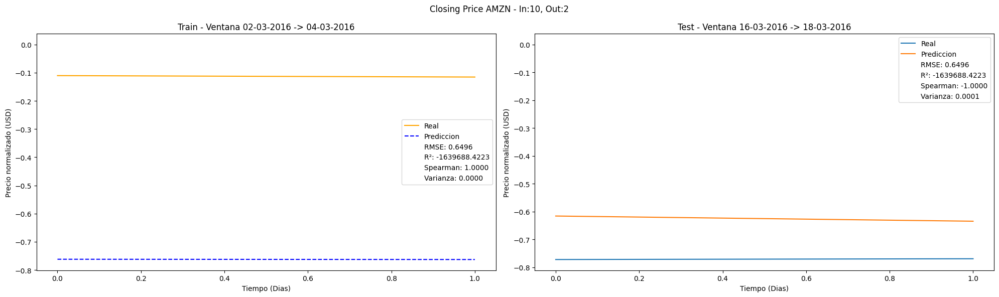

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9801
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.9435
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.9037
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.8536
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.7849
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.6917
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5818
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.4820
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.4035
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3387
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2815
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2296
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1833
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1438
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1123
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/st

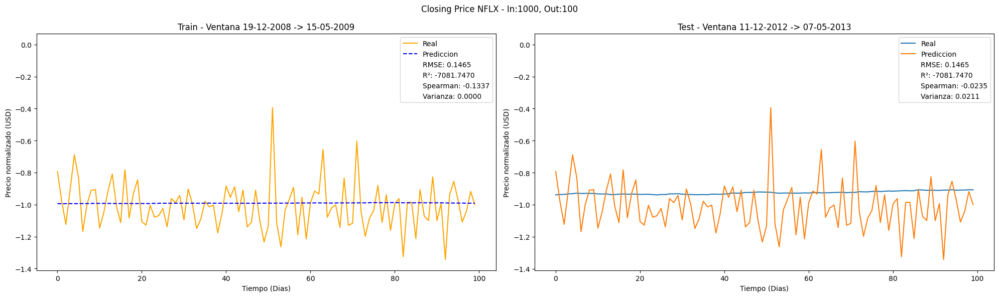

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9010
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.8601
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.8138
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7570
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.6846
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5932
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4900
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4027
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3447
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2974
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.2512
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2059
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1639
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1277
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0984
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

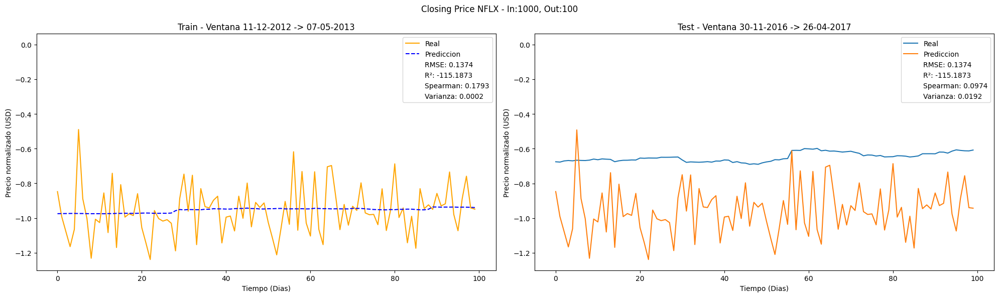

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5126
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4894
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4683
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.4443
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4135
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3712
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.3143
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.2513
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2090
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1880
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1605
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1280
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0998
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0789
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0633
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/st

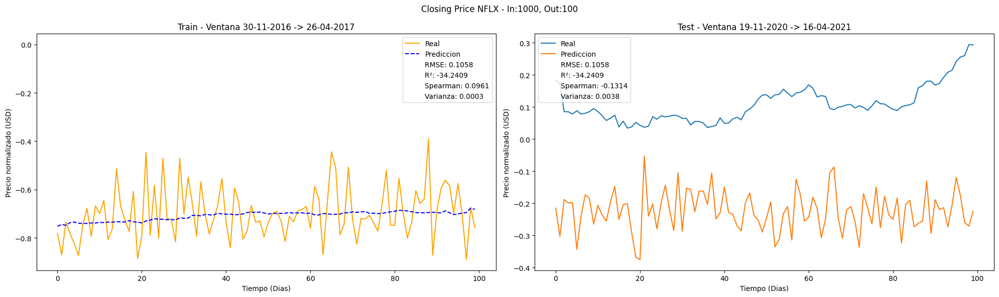

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0278
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0261
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0245
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0226
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0203
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0175
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0146
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0127
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0108
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0084
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0069
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0059
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0047
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0035
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0026
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/st

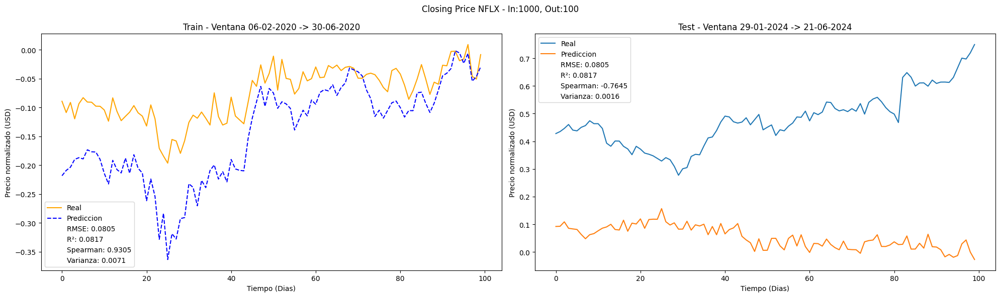

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0301
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.8977
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.7722
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6405
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4917
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3243
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1677
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0909
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0996
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1001
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0704
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0379
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0242
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0282
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0363
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

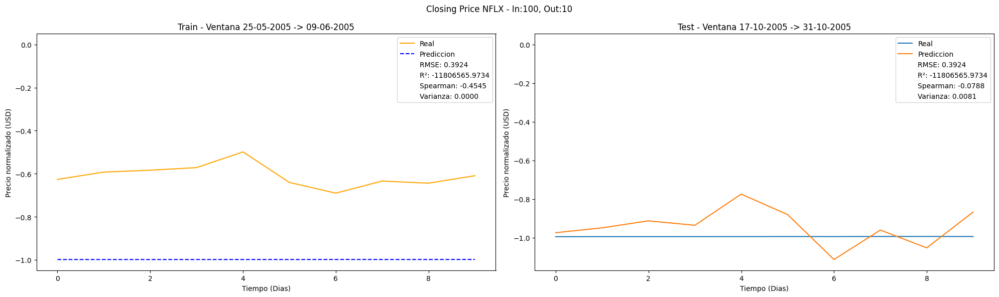

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9725
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.8626
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.7537
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6310
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4864
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3248
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1911
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1597
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1547
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1043
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0438
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0125
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0141
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0279
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0367
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

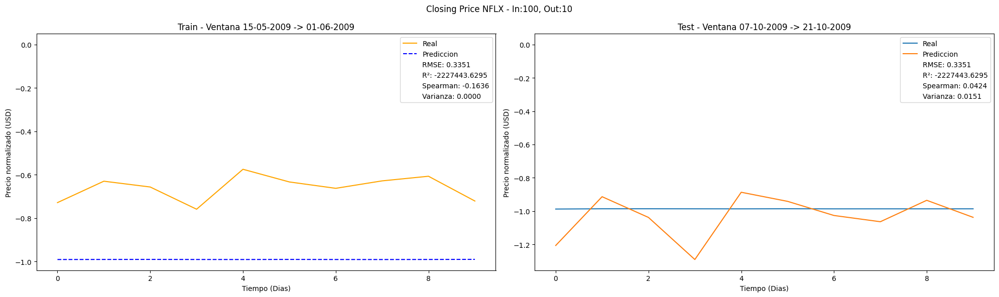

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8952
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.7922
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.6882
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.5725
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.4361
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.2752
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1129
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0406
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.1080
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1133
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0641
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0228
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0104
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0172
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0288
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

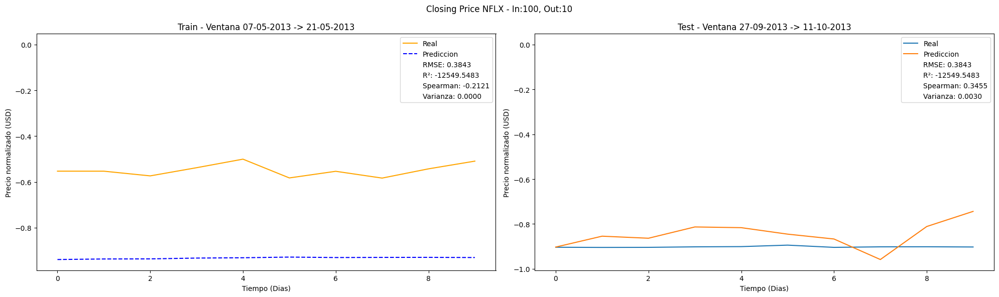

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6696
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.5866
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5048
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4112
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2969
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1647
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0588
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0725
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1013
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0718
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0313
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0115
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0123
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0204
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0265
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

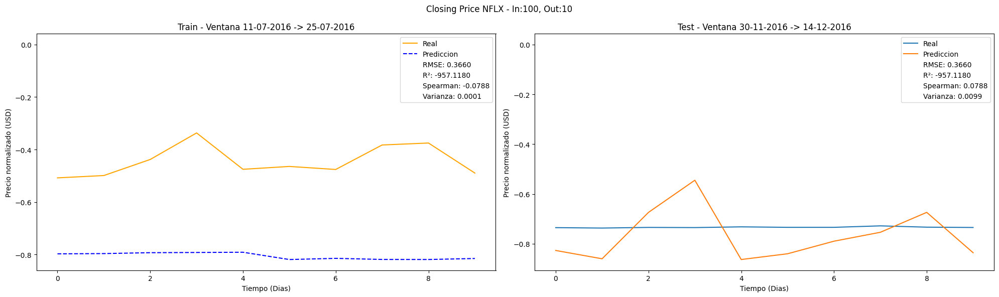

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8063
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6293
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4562
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.2877
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1346
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0242
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0106
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1066
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1419
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0974
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0398
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0064
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 6.3945e-04
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0115
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0270
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55m

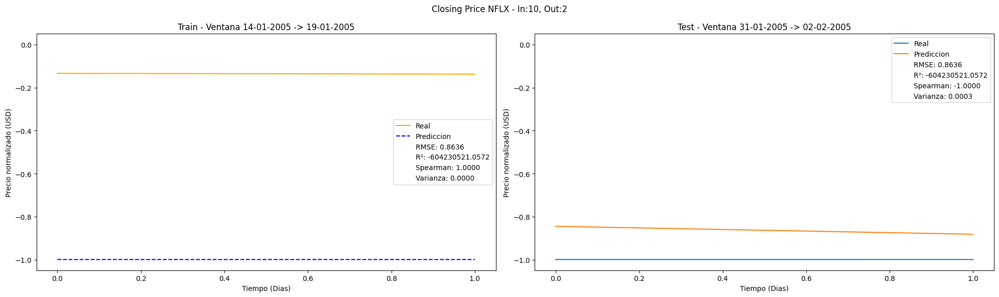

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9706
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.7806
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.6065
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4415
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2846
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.1427
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0363
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0046
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0750
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1379
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1204
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0666
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0220
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0024
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0037
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

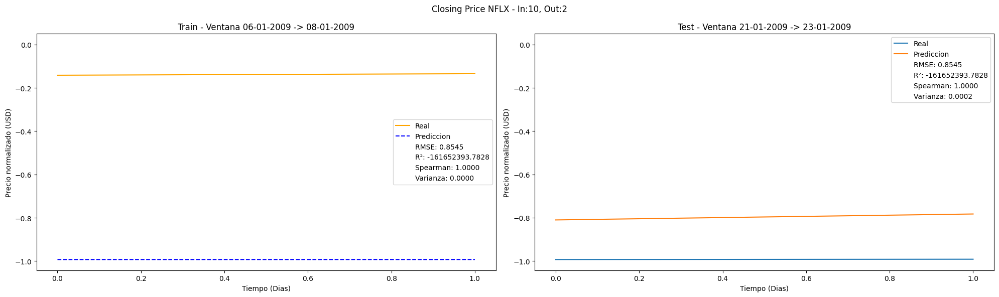

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8776
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7155
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.5663
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4236
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2859
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1575
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0525
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 6.8194e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0404
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1148
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1208
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0775
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0313
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0053
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 9.2347e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

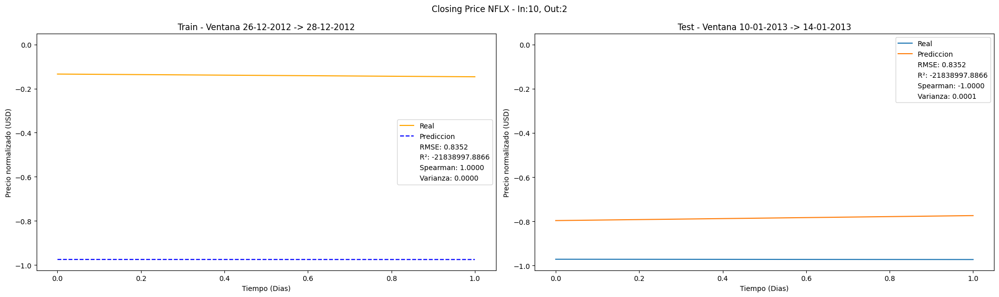

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6485
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5175
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.4019
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2953
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1953
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1047
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0330
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1.6444e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0293
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0799
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0843
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0549
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0229
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0042
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 1.6645e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

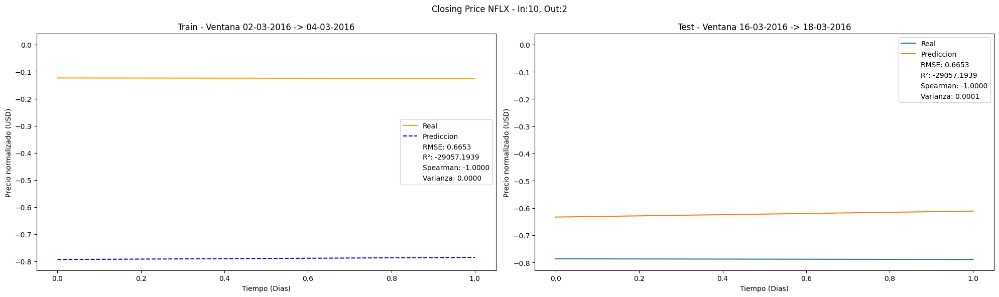

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9843
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.9442
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.9035
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.8543
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.7884
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.6993
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.5898
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.4811
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.3979
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3405
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2951
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2525
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2117
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1745
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1423
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/s

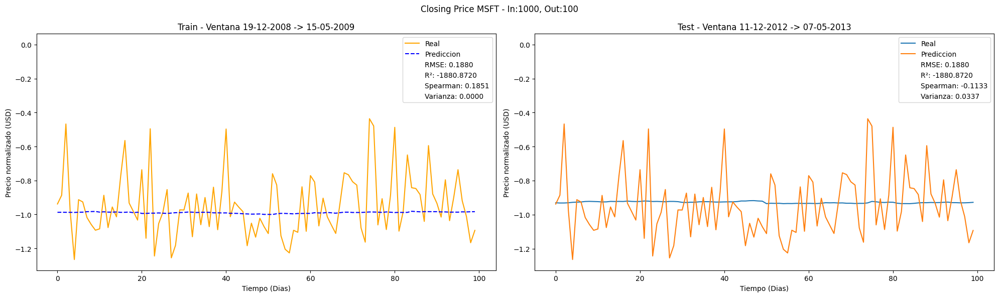

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8950
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8624
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8265
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7804
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7153
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6238
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.5107
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.4074
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3384
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2953
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2566
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2147
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1732
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1360
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1049
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

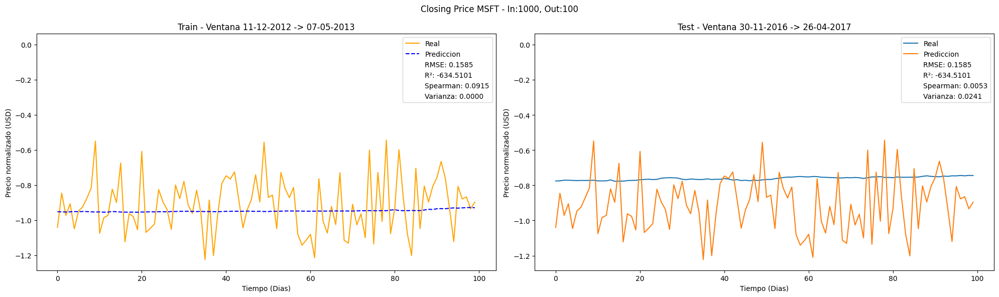

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6295
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.6013
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.5719
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.5365
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.4903
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.4288
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.3544
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2824
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2324
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2028
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1752
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1456
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1163
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0896
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0675
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms

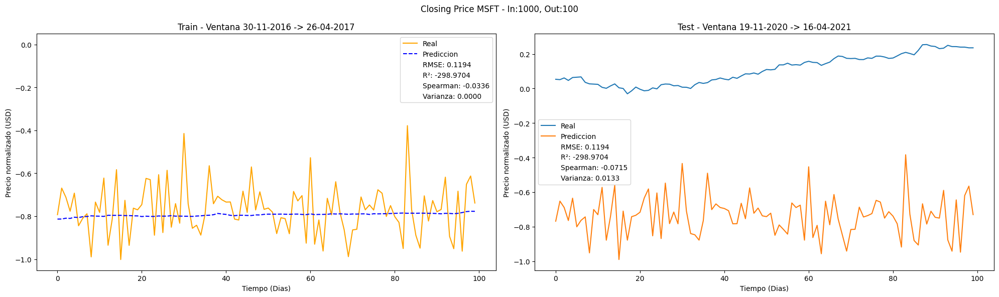

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1018
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0969
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0915
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0848
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0756
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0626
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0455
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0340
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0375
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0268
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0165
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0127
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0117
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0102
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0077
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

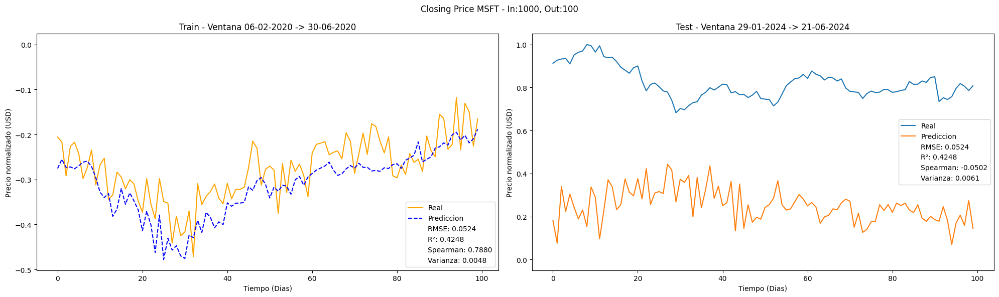

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8950
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.7820
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.6613
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5227
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3634
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2016
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1033
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0971
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0960
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0731
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0462
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0281
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0214
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0226
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0274
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

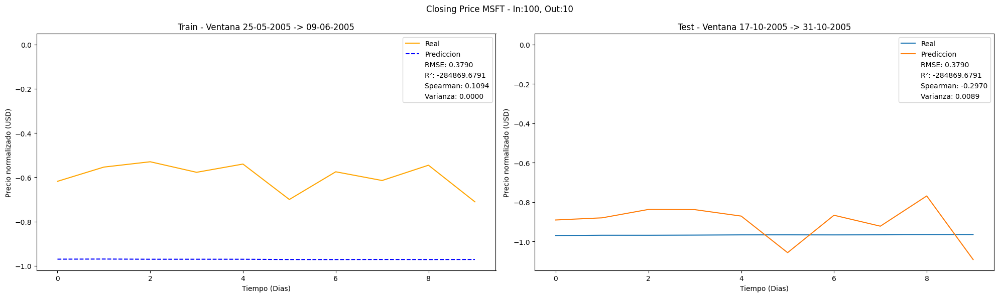

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9024
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.7499
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5888
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4051
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2070
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0617
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1027
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1292
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0766
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0237
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0056
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0148
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0313
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0423
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0441
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

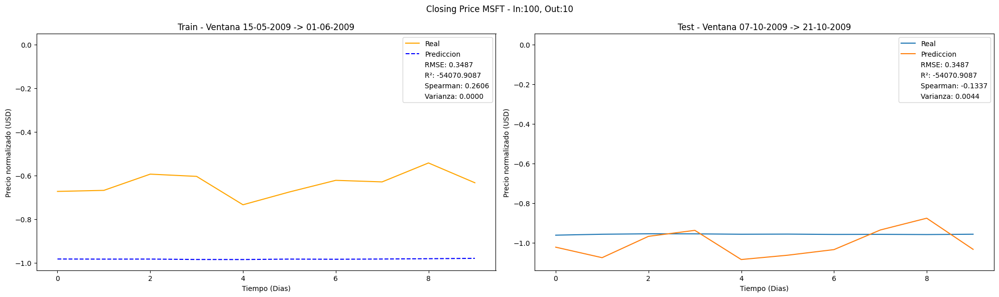

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8719
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.7625
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6568
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5372
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.3902
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2175
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0784
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0680
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1015
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0849
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0487
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0237
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0165
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0205
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0273
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

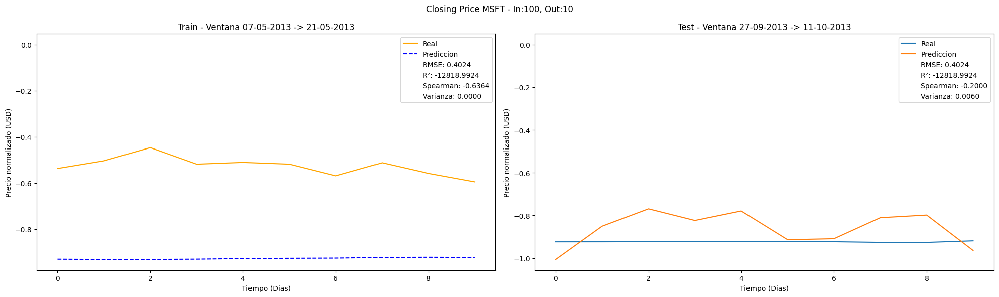

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7074
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.6199
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.5340
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4378
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3240
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1973
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0966
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0874
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1019
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0749
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0342
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0101
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0094
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0201
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0289
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/st

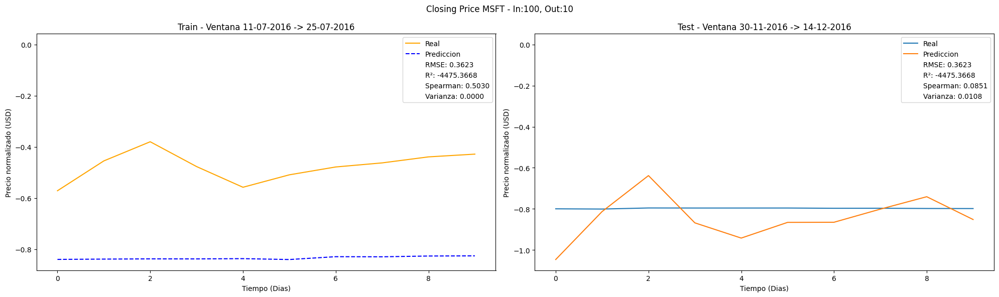

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0385
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.8877
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.7533
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.6268
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5028
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3786
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2554
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1402
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0503
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0167
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0612
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1170
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1148
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0730
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0307
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

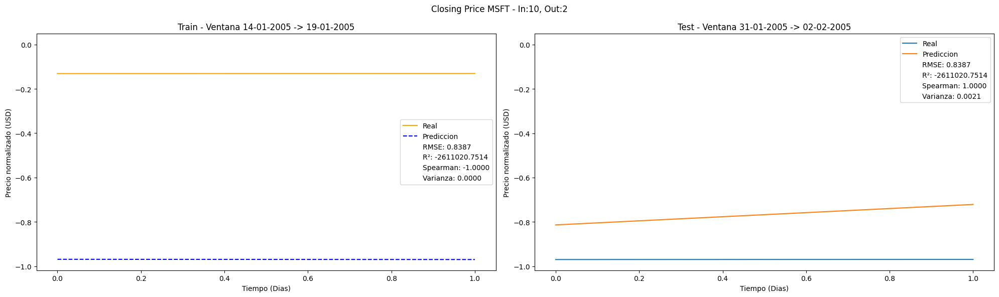

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8929
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7332
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5827
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4353
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2900
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1532
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0437
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 3.1281e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0645
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1357
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1226
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0683
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0218
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0014
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0031
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43m

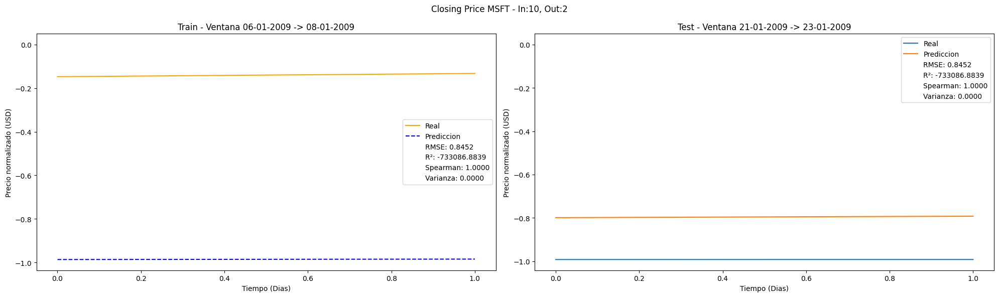

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9261
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7781
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6380
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5004
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3629
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2273
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1038
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0167
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0109
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0967
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1368
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1033
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0495
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0123
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1.2047e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42m

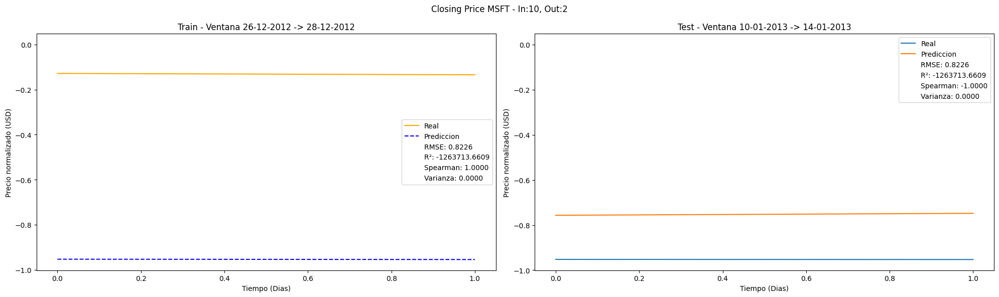

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7120
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5997
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4929
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3874
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2814
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1769
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0815
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0141
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0088
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0734
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1058
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0808
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0394
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0107
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0012
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/st

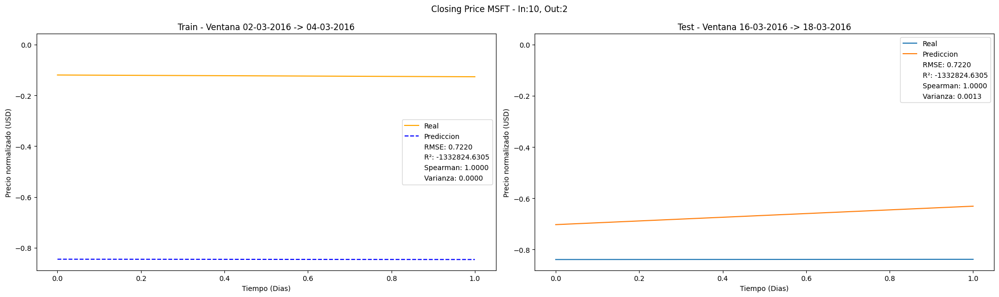

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9998
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.9658
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.9295
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8851
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8252
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7412
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6293
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.5037
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3961
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.3206
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.2662
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.2212
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.1814
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1463
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1161
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms

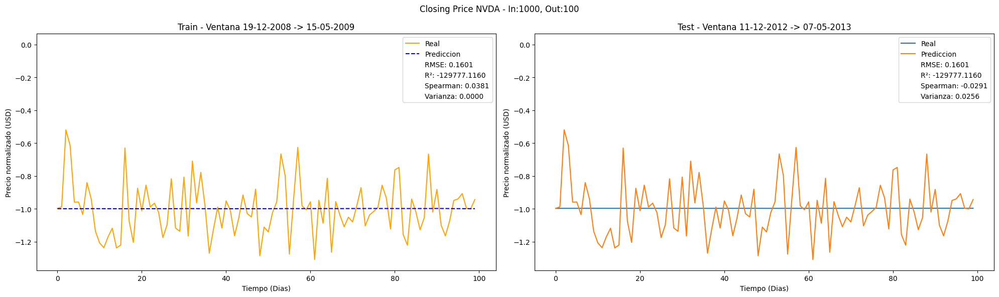

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.9962
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.9566
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.9173
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.8710
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.8107
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.7307
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.6315
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5254
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.4320
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3626
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3080
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2584
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2129
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1723
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1374
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/s

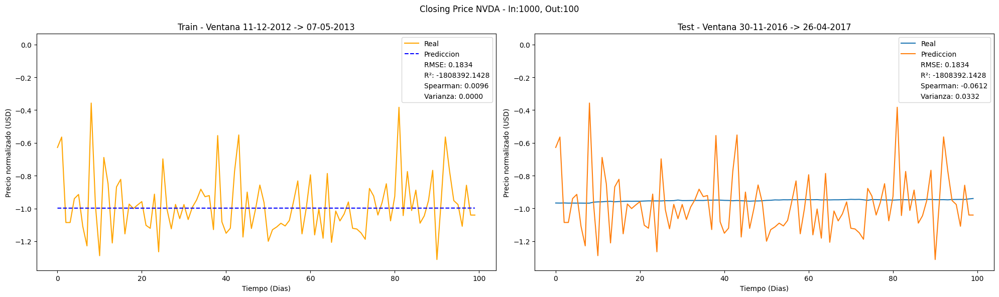

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9379
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.9007
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.8614
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.8127
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7452
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.6494
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5293
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4199
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3481
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.3025
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2649
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2256
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1845
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1451
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1104
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

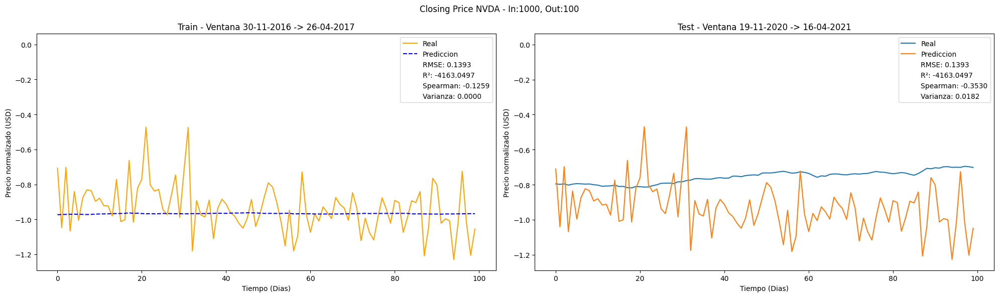

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8205
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.7901
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7600
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7249
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6800
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.6189
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5359
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4330
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.3341
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2659
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2233
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.1890
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1554
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1235
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0955
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

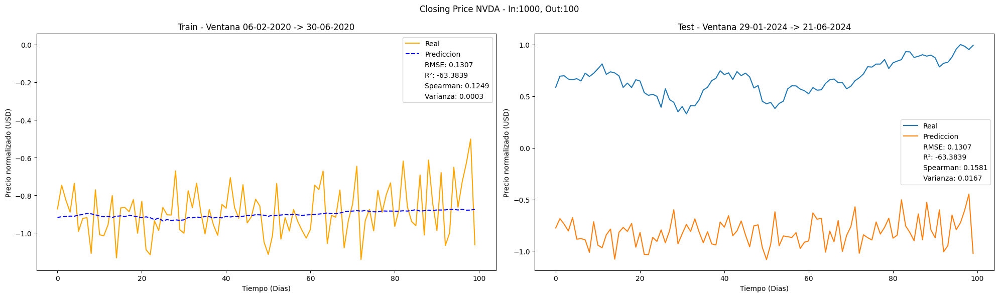

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9737
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.8338
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.6839
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5138
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3309
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1782
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1154
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1054
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0818
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0459
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0210
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0182
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0300
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0417
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0455
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

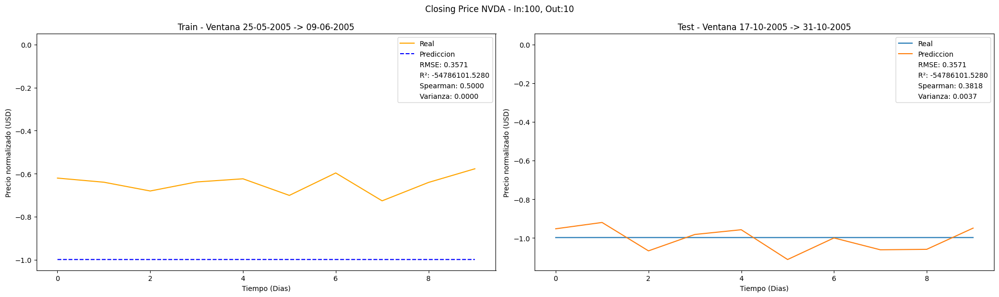

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9035
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.7741
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6263
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4470
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2408
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0850
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1174
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1372
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0830
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0291
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0119
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0225
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0386
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0471
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0455
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

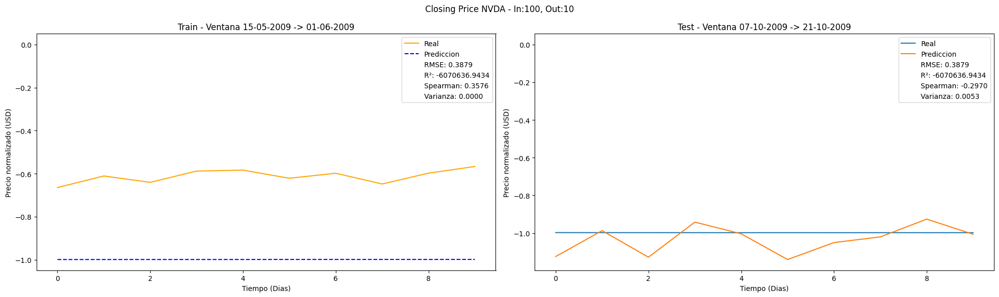

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9879
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.8507
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.7115
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5554
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.3762
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1956
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0853
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0844
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0968
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0762
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0457
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0289
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0288
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0341
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0361
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

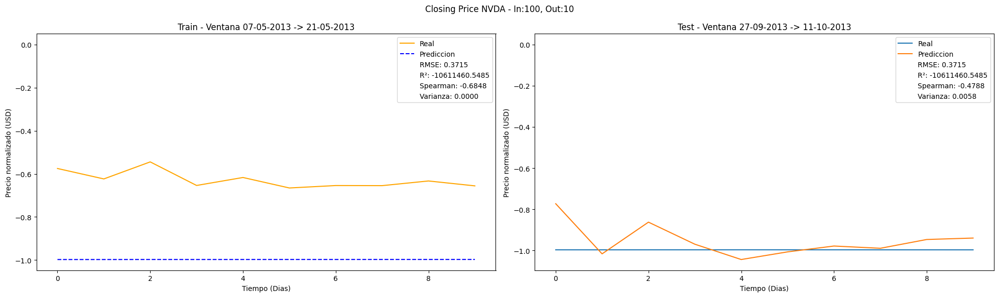

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9452
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.8074
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6623
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5001
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3179
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.1456
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0672
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0873
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0907
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0658
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0399
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0290
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0301
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0340
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0353
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

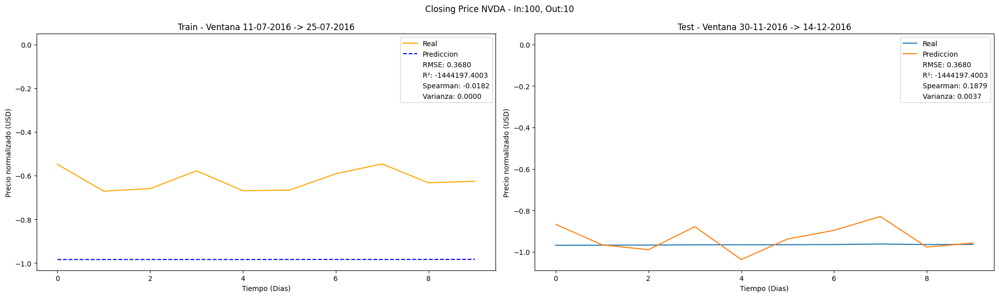

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0181
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.8342
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6687
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5127
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3621
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2187
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0935
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0116
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0155
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1013
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1393
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1062
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0521
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0137
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 2.7741e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42m

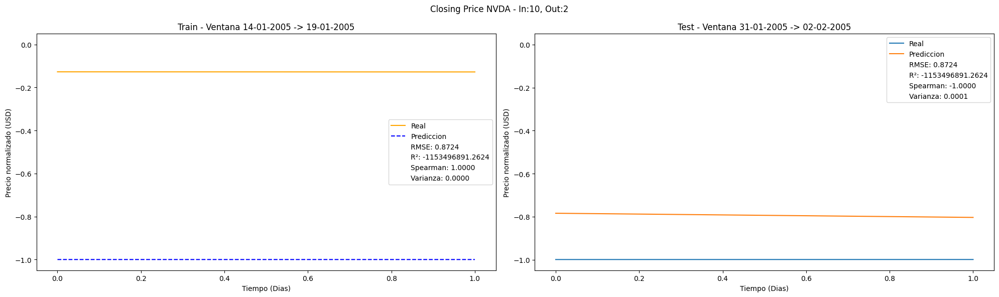

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0241
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.8355
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6643
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5020
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3453
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1980
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0743
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0058
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0373
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1228
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1372
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0914
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0387
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0082
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0022
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

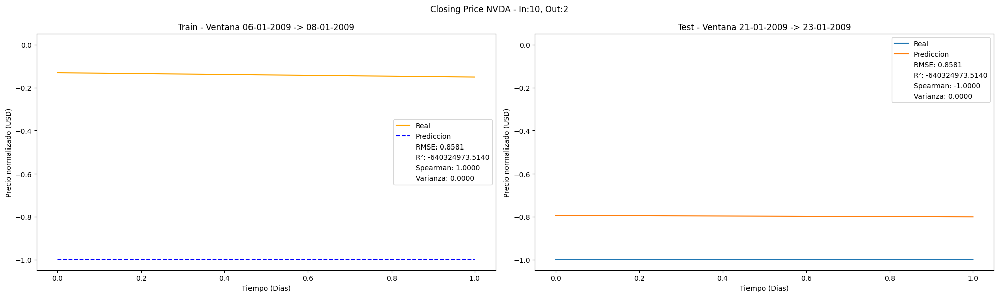

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9388
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7545
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5844
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4210
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2644
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1242
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0248
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0910
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1403
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1124
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0578
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0170
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0016
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0056
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

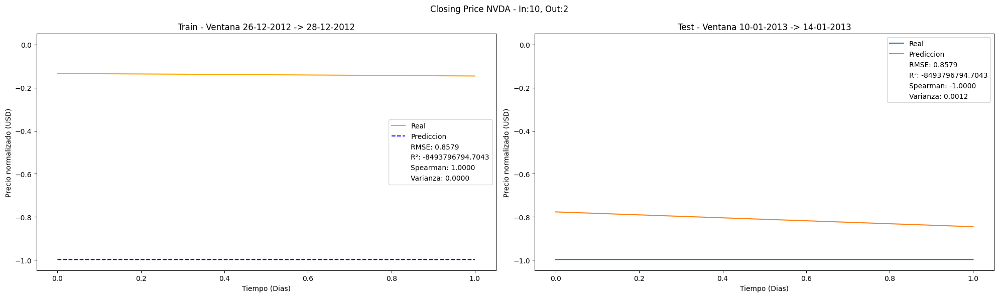

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9223
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.7567
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.5984
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4427
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2892
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1461
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0357
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0024
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0816
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1435
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1192
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0617
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0176
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 6.7495e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0049
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43m

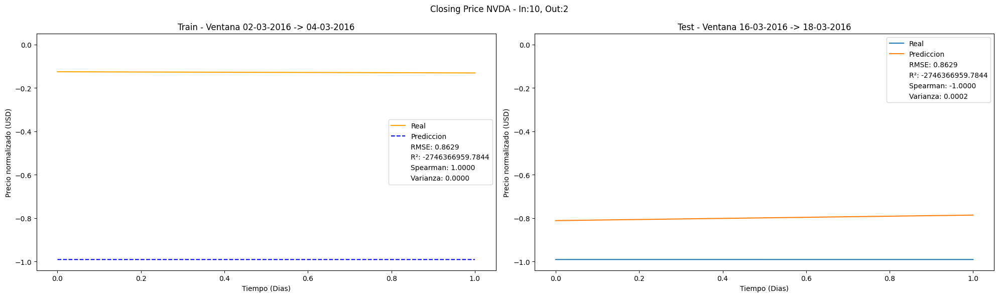

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.9349
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.9049
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.8746
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.8380
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.7871
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.7117
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.6028
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.4683
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.3394
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2531
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2066
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1701
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1351
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1025
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0748
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/st

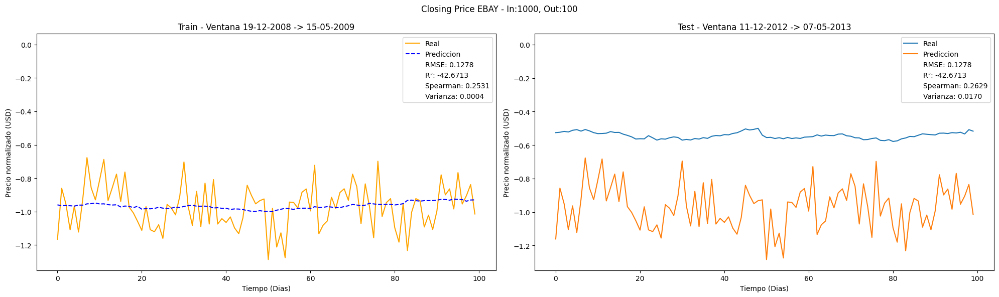

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.2924
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2808
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2694
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2563
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2396
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2169
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1852
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1449
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1152
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1160
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1015
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0767
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0580
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0487
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0433
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/st

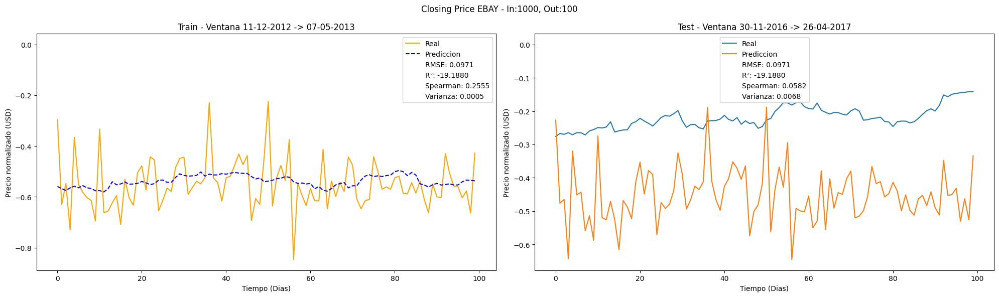

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0927
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0870
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0812
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0744
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0656
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0538
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0405
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0346
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0314
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0218
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0147
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0119
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0102
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0081
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0058
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92m

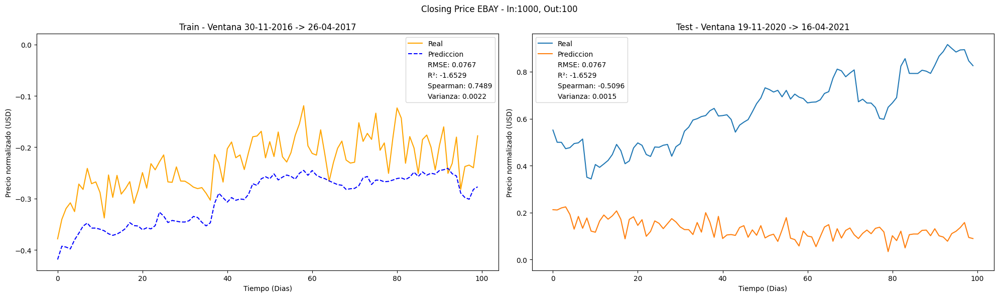

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0379
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0362
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0345
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0324
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0298
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0264
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0221
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0184
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0180
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0143
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0109
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0091
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0078
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0062
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0045
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/st

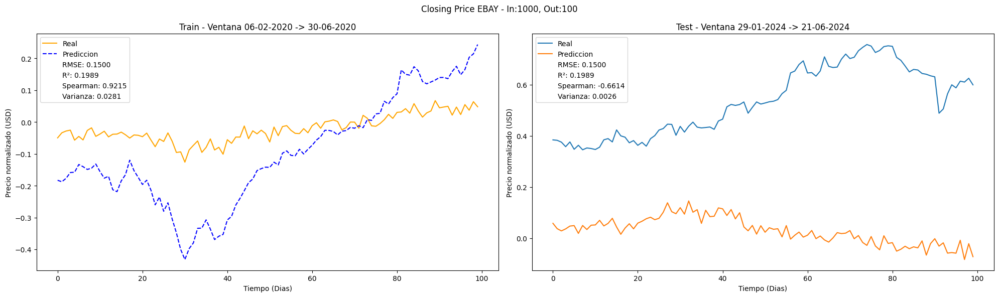

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4876
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4224
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3551
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2766
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1821
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0792
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0256
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0948
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0763
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0256
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0022
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0063
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0188
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0277
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0296
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

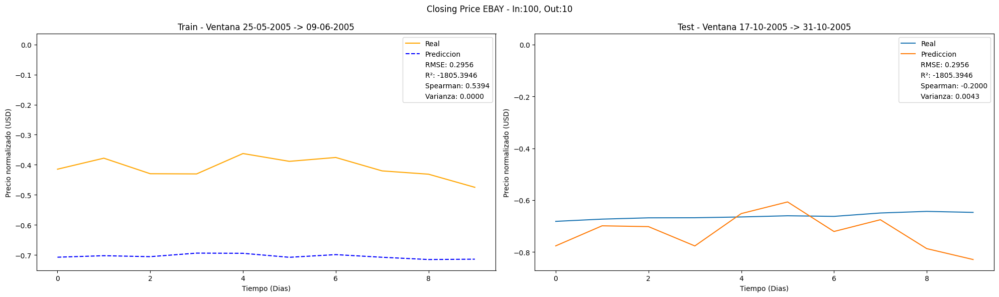

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8361
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.7245
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6166
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4990
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.3627
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2103
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0851
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0881
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1199
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0862
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0361
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0091
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0092
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0221
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0340
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

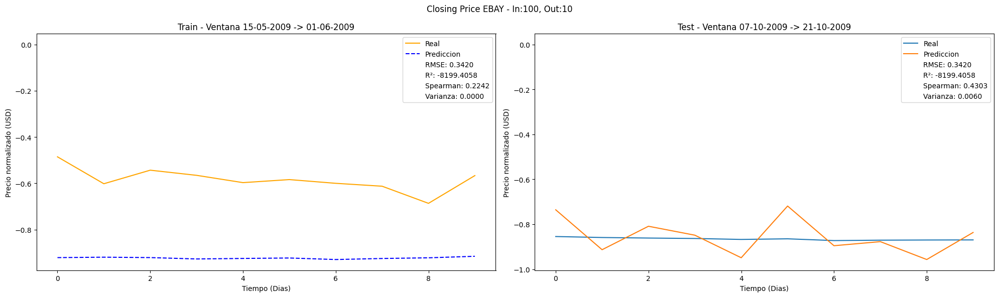

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.2643
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2245
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1852
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1412
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0909
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0452
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0463
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0394
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0146
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0028
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0047
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0103
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0135
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0136
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0117
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

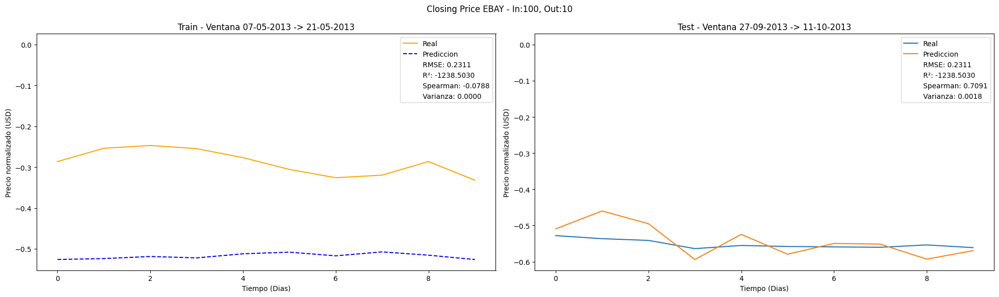

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1791
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1506
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1223
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0919
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0582
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0238
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0063
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0332
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0218
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0047
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 9.3279e-04
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0046
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0091
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0115
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0116
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47m

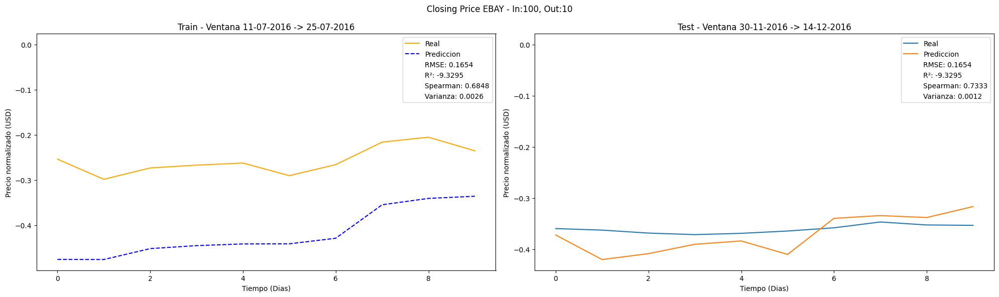

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.2920
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2347
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1801
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1273
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0772
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0335
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0046
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0053
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0343
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0463
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0338
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0155
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0034
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 4.1263e-05
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0026
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45m

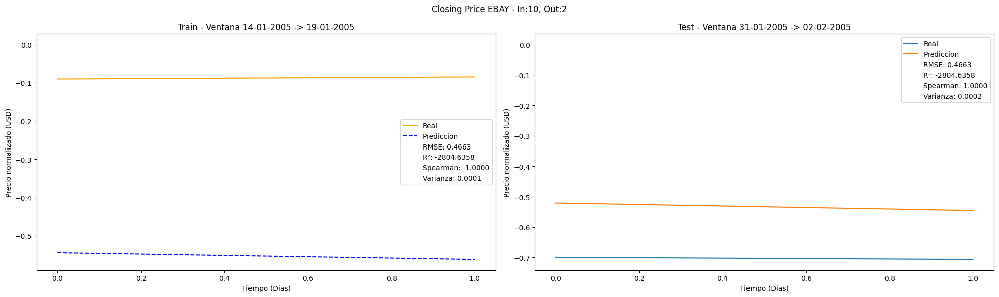

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8848
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7032
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5364
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.3796
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2331
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1055
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0182
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0817
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1269
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1041
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0558
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0179
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0021
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0041
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

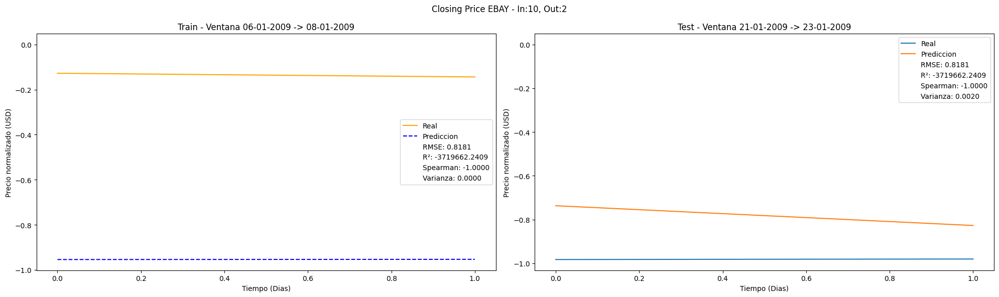

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3573
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2872
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2261
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1701
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1176
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0696
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0292
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0039
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0047
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0307
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0456
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0374
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0202
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0065
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 5.6325e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43m

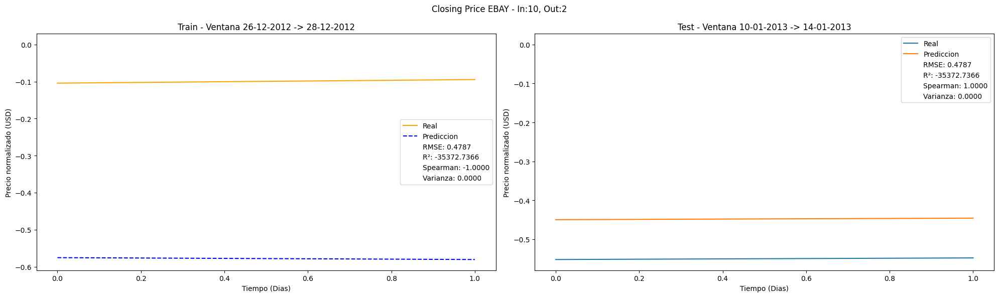

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.2704
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2151
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1647
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1179
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0746
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0370
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0103
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0029
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0183
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0333
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0308
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0190
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0083
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0030
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0025
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

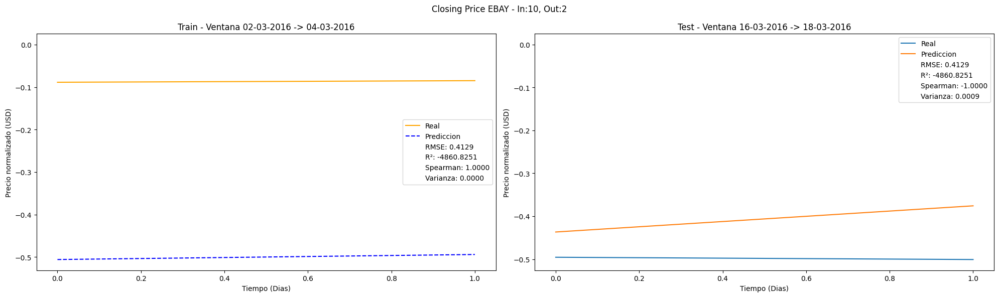

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.8421
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.8029
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.7598
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.7041
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.6253
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.5182
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.4032
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3158
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2634
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2268
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1903
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1535
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1190
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0891
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0657
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/st

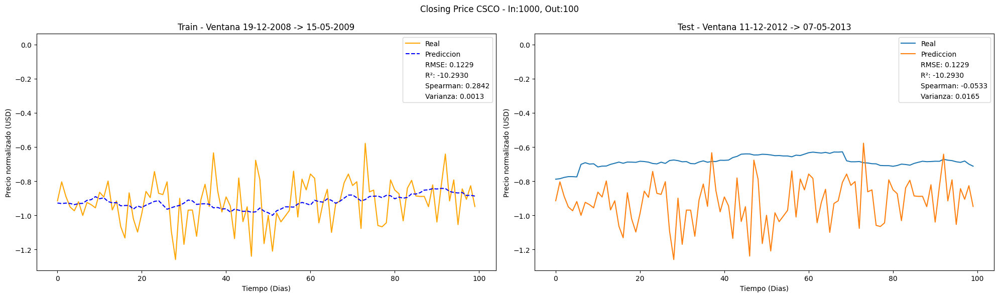

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6274
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.6044
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.5807
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.5514
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.5113
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.4559
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.3843
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.3051
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2342
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.1838
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1519
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1262
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.1010
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0769
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0556
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/st

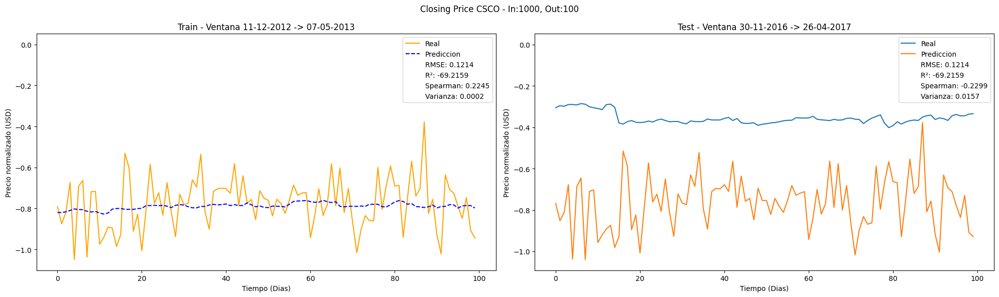

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1377
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1311
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1241
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1156
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.1045
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0897
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0717
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0576
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0530
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0448
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0322
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0219
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0164
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0135
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0109
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/st

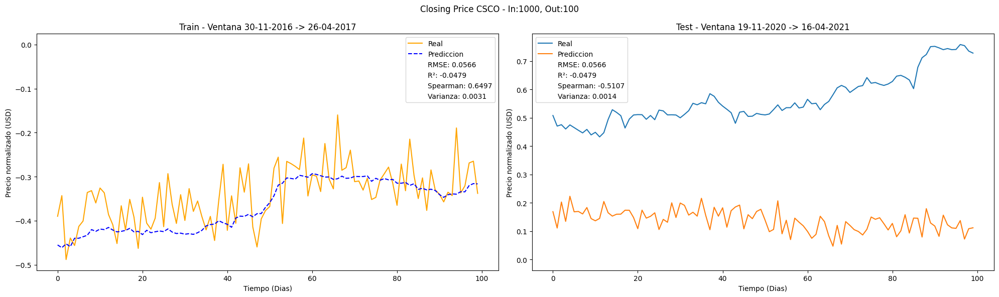

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0257
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0231
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0205
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0177
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0145
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0114
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0099
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0084
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0059
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0042
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0033
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0026
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0019
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0014
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0013
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/s

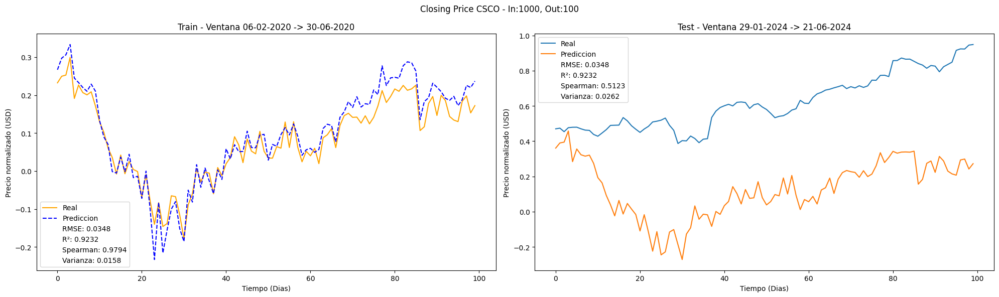

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7006
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6034
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5069
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3990
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2697
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1257
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0513
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1135
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0901
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0338
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0070
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0116
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0259
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0353
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0362
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

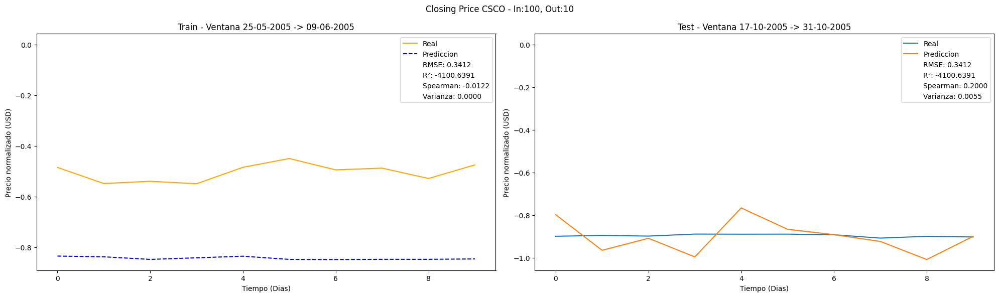

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8209
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.7363
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6578
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5734
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.4737
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3513
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2112
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0884
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0390
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0536
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0615
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0552
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0462
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0378
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0293
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/st

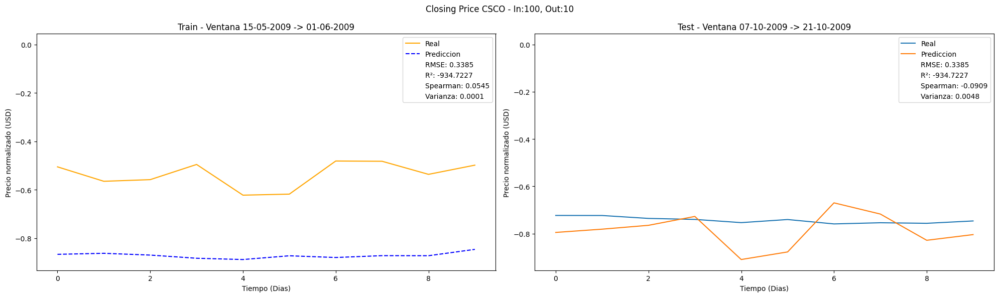

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5485
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4792
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4109
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.3369
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2532
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1614
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0827
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0567
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0623
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0523
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0303
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0149
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0131
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0196
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0260
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

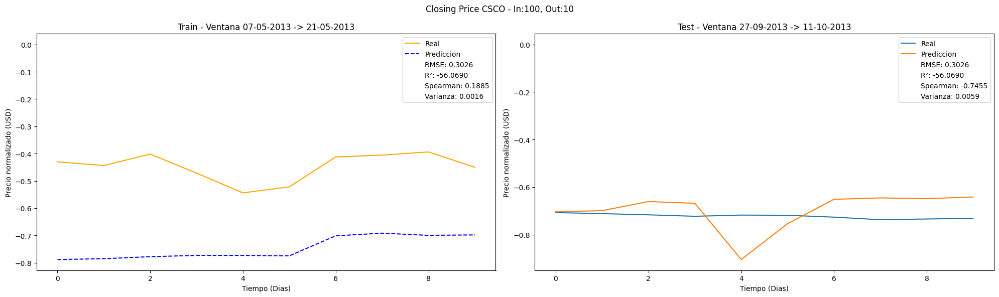

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1921
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1639
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1358
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1049
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0697
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0336
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0181
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0317
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0176
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0035
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0028
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0116
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0123
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0104
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

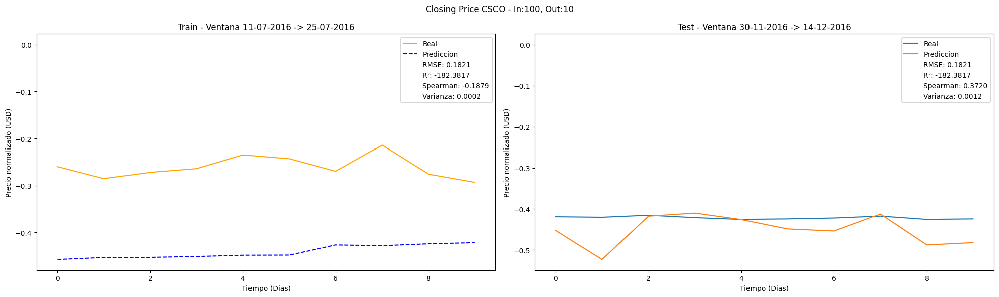

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7825
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6520
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5298
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4111
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2943
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1822
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0840
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0196
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0190
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0735
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0995
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0773
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0407
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0155
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

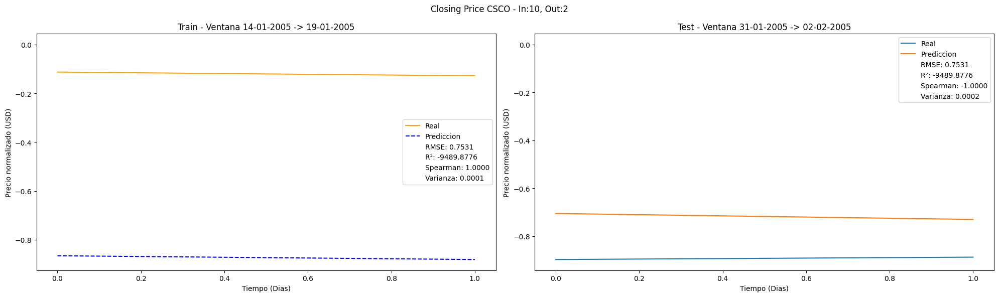

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8419
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.7073
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5825
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4622
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3446
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2313
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1283
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0488
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0130
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0334
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0742
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0868
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0708
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0464
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0270
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

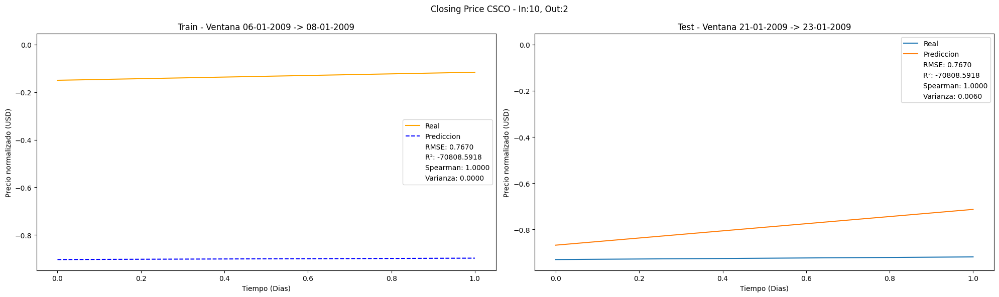

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7560
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6245
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5057
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3933
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2844
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1800
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0866
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0202
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0086
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0605
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0979
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0832
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0462
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0160
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0029
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

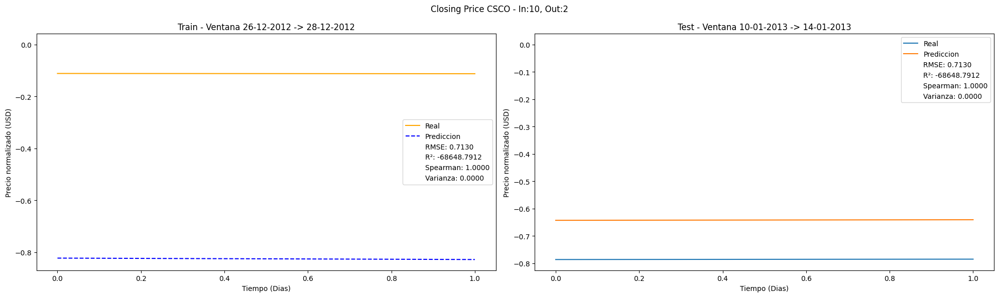

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3011
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2430
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1879
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1346
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0837
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0388
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0041
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0291
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0441
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0355
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0190
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0068
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0020
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0028
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

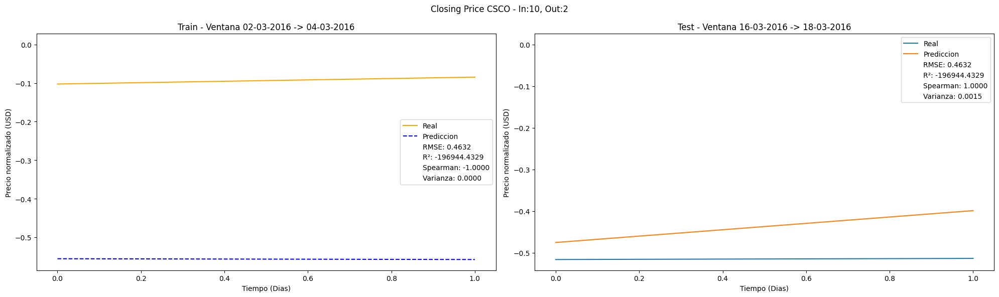

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8910
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.8606
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.8269
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.7843
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.7267
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.6483
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.5489
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.4434
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.3575
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2970
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2489
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2064
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1683
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1353
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1073
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/st

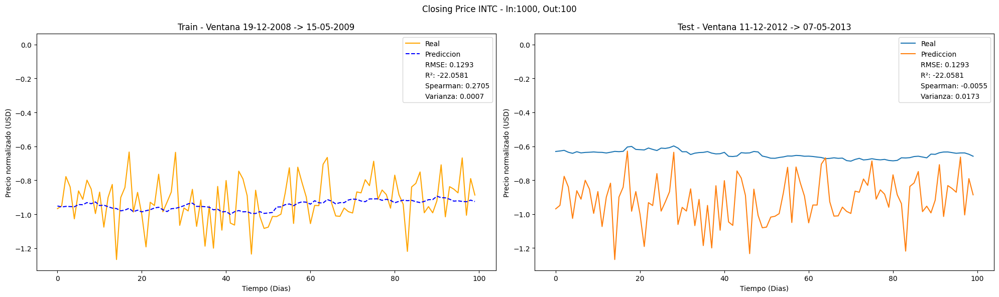

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5088
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.4882
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.4670
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.4410
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.4061
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3578
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2926
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2175
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1648
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1489
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1333
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.1088
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0821
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0595
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0434
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

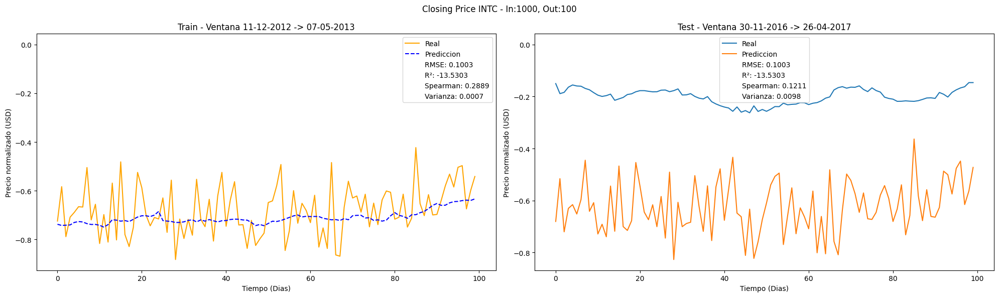

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0378
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0357
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0336
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0312
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0281
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0242
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0196
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0161
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0150
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0112
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0079
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0062
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0051
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0039
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0030
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/s

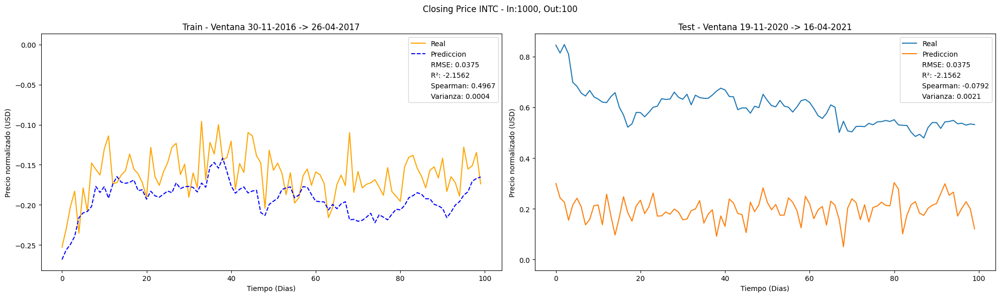

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4327
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.4136
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3934
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3684
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3347
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2881
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.2272
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1631
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1238
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1090
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0924
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0707
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0496
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0333
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0225
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/s

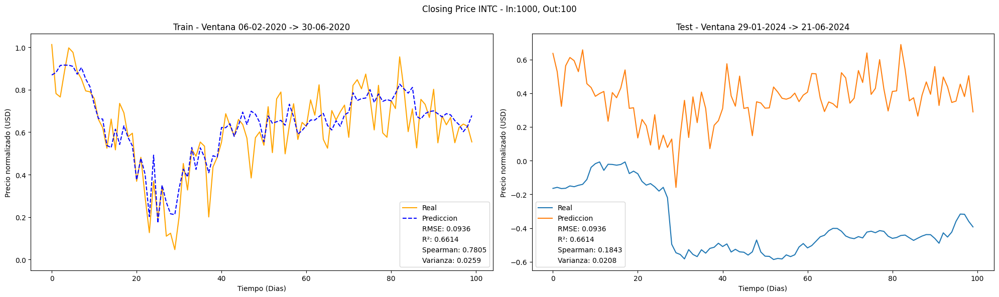

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4856
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.4210
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3571
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2850
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2000
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1078
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0480
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0633
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0605
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0310
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0098
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0076
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0158
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0237
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0267
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/st

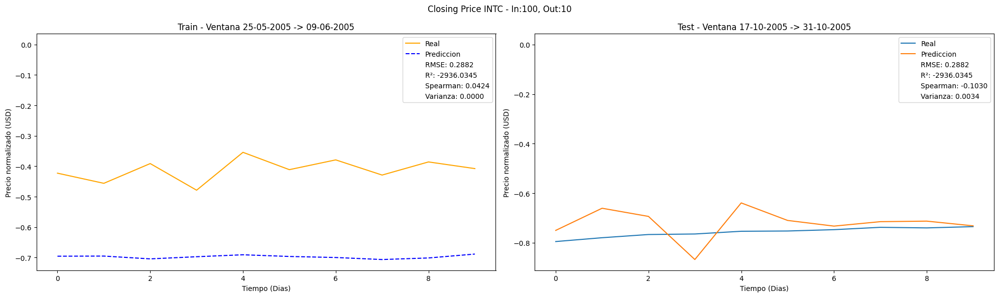

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8044
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.6803
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5495
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4028
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2441
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1066
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0625
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0944
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0891
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0522
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0204
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0104
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0169
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0272
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0329
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/st

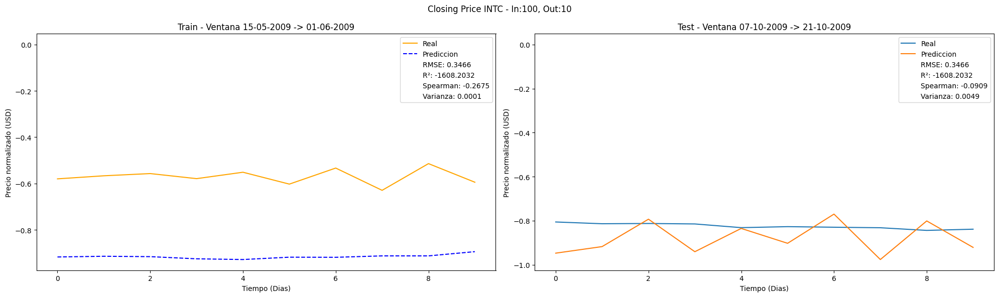

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4221
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.3607
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3046
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2435
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1705
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0860
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0200
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0536
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0611
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0270
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0052
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0060
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0157
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0232
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0249
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

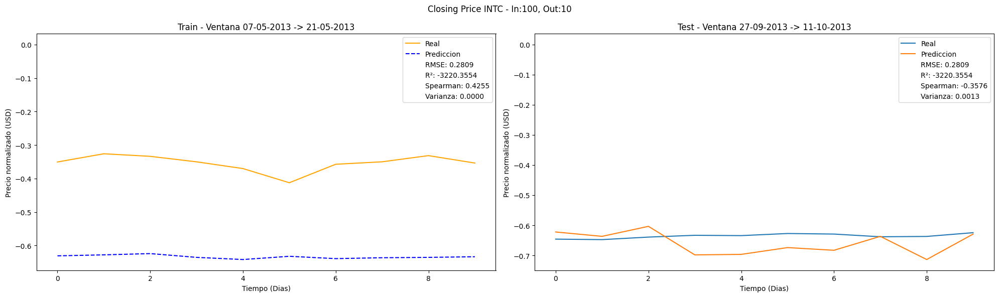

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0630
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0499
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0373
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0241
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0106
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0024
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0110
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0020
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 5.1442e-04
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0017
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0032
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0040
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0039
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0032
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55m

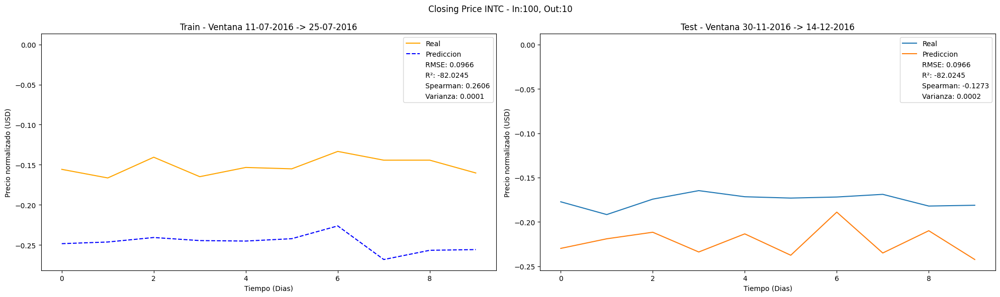

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7426
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.6274
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5260
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4315
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.3388
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2461
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1549
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0721
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0135
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0067
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0599
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0946
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0788
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0435
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0155
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/st

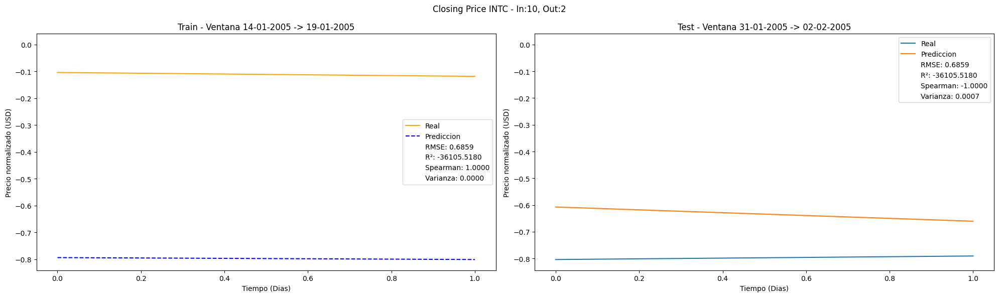

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8734
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.7014
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5463
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.4016
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2659
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1432
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0463
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0011
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0376
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1051
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1133
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0751
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0320
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0064
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 8.9960e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43m

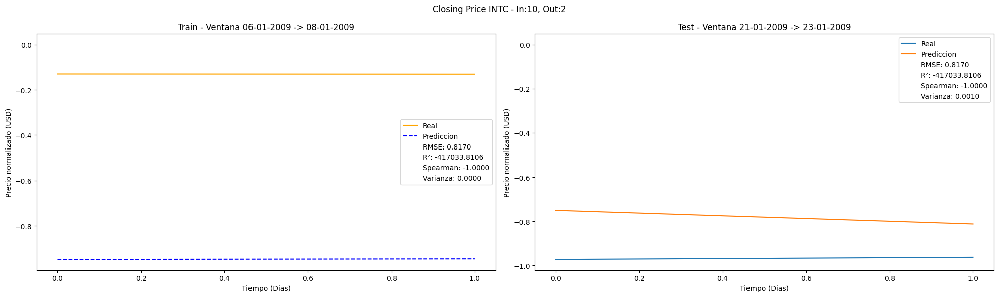

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5236
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4186
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3224
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2317
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1468
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0722
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0196
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0081
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0428
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0689
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0582
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0323
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0123
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0049
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0071
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

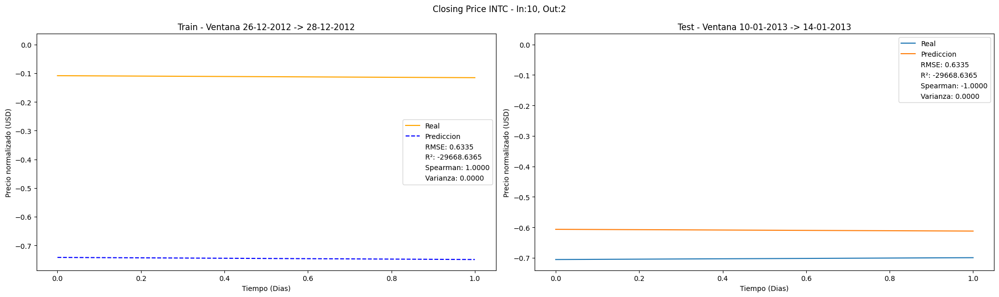

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1563
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1218
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0921
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0657
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0421
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0220
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0076
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0018
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0061
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0139
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0160
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0125
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0042
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0027
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

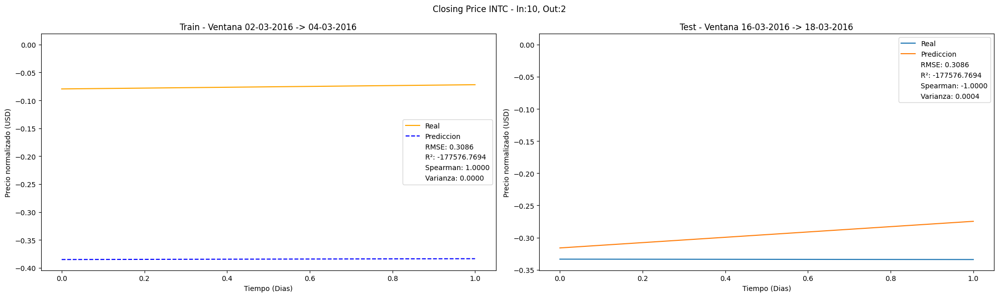

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9173
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.8783
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.8352
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.7800
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7053
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.6083
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.5003
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.4023
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.3286
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2759
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.2344
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1970
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1616
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1286
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0990
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

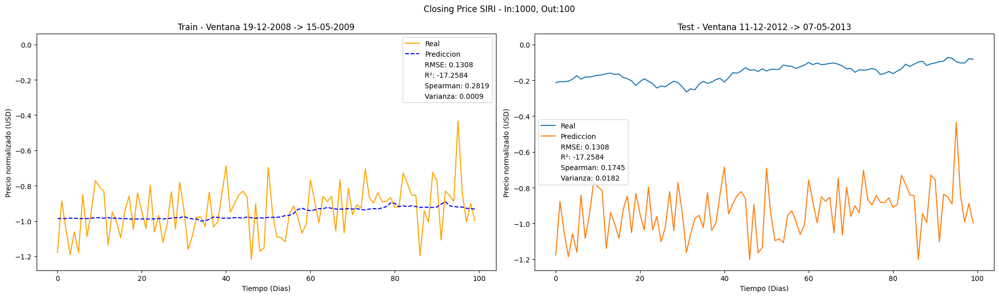

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0773
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0731
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0687
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0635
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0569
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0484
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0381
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0304
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0301
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0239
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0163
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0123
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0106
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0090
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0068
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/st

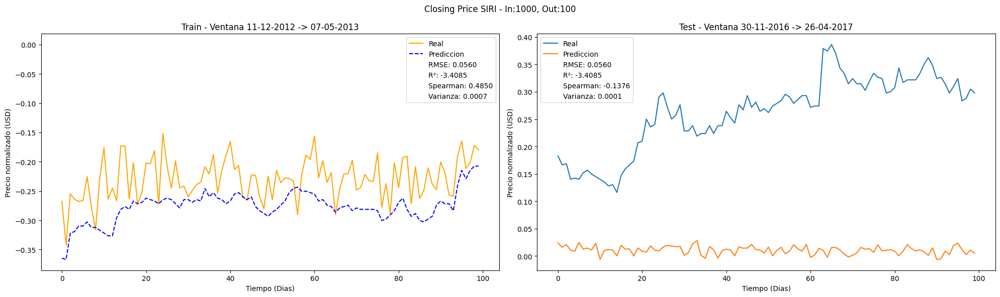

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0256
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0247
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0238
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0227
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0214
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0197
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0175
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0147
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0115
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0096
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0100
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0073
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0052
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0043
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0037
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

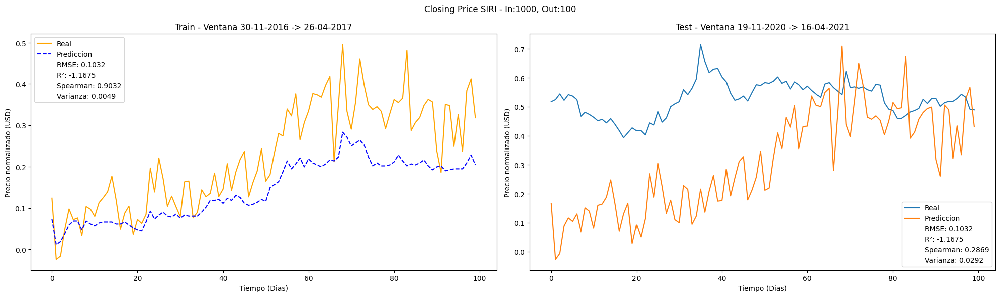

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1891
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1775
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1670
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1558
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1423
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1251
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1036
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0816
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0718
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0638
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0485
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0344
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0257
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0208
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0166
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/

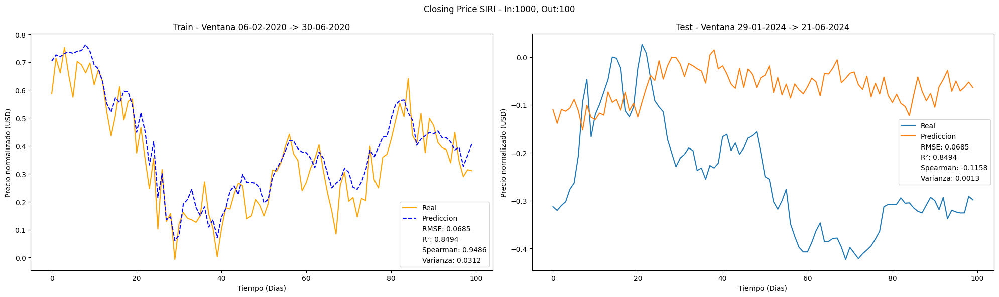

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1337
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1203
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1070
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0927
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0759
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0552
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0302
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0100
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0387
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0129
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0014
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0033
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0075
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0100
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0103
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

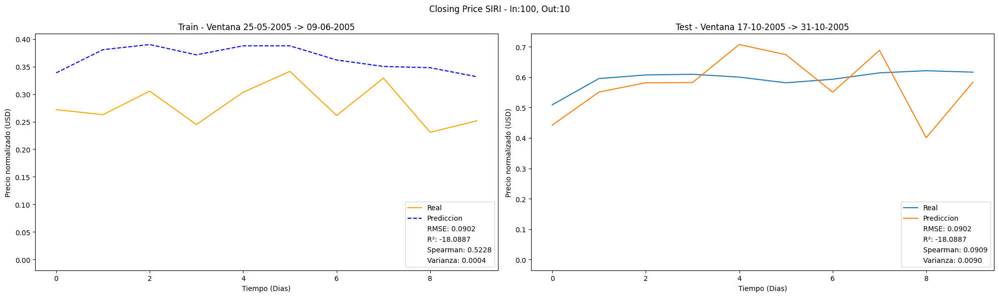

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8430
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.7346
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6252
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.5020
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3584
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2109
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1151
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1047
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0952
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0551
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0243
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0181
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0250
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0323
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0346
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

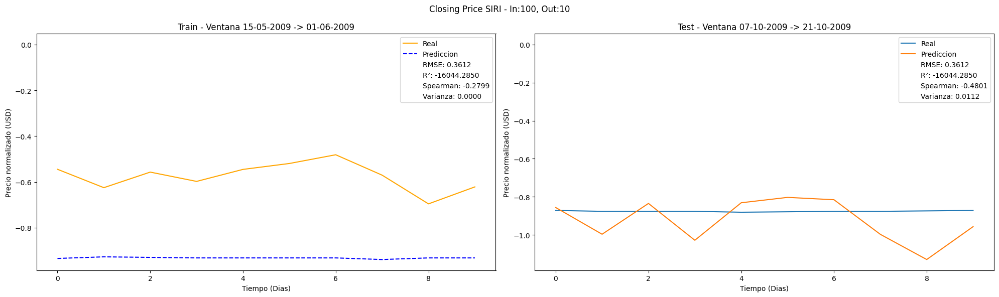

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0383
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0306
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0237
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0169
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0100
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0039
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0025
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0054
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0032
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 8.7492e-04
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 6.6390e-04
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0014
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0021
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0023
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0021
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

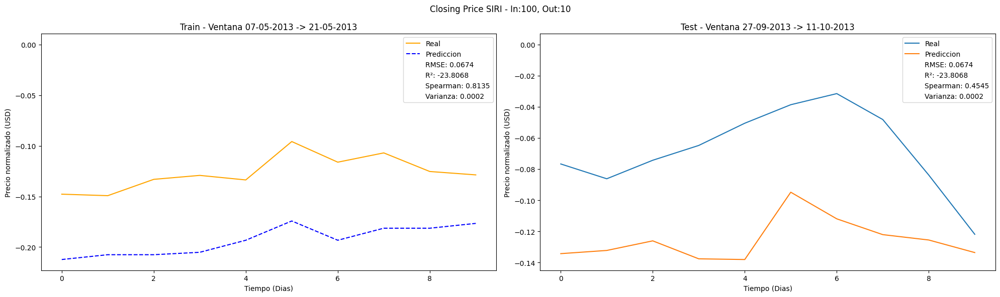

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.0072e-04
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 3.5130e-04
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 1.0495e-04
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 2.2893e-05
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 6.8483e-05
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 1.1953e-04
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 1.0954e-04
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 6.9104e-05
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 3.1394e-05
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 1.0126e-05
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 6.4292e-06
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 1.5076e-05
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.7707e-05
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 3.6268e-05
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss

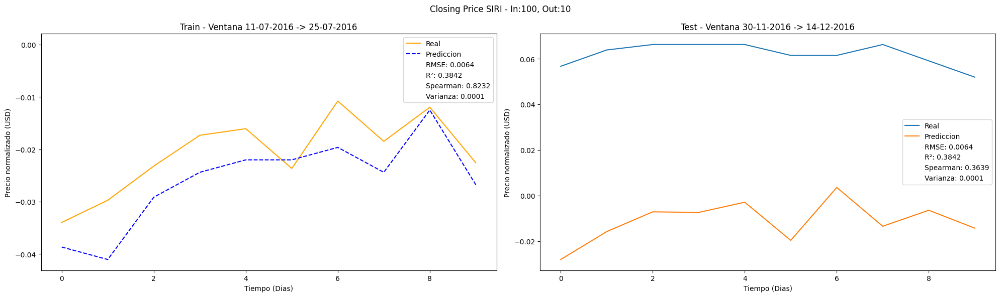

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1369
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0960
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0597
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0293
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0080
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0021
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0123
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0203
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0173
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0100
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0045
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0023
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0024
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0036
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0047
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

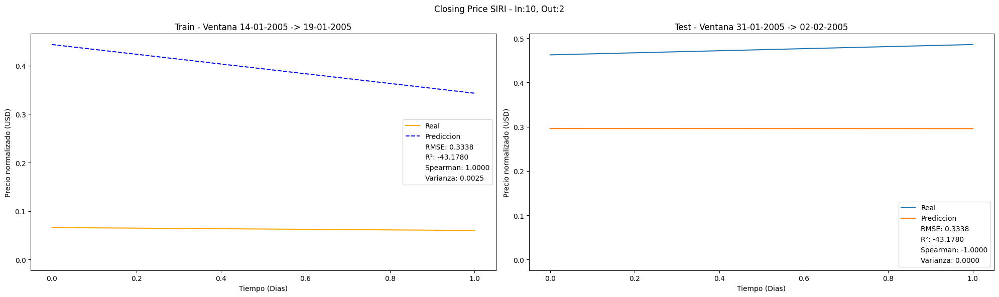

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.9231
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.7635
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.6120
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4622
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.3133
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1720
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0564
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0040
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0552
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1278
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1242
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0760
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0311
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0089
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0071
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/st

<ipython-input-13-3e76e10468da>:75: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearmanr_test, _ = spearmanr(np.squeeze(y_real), y_pred)


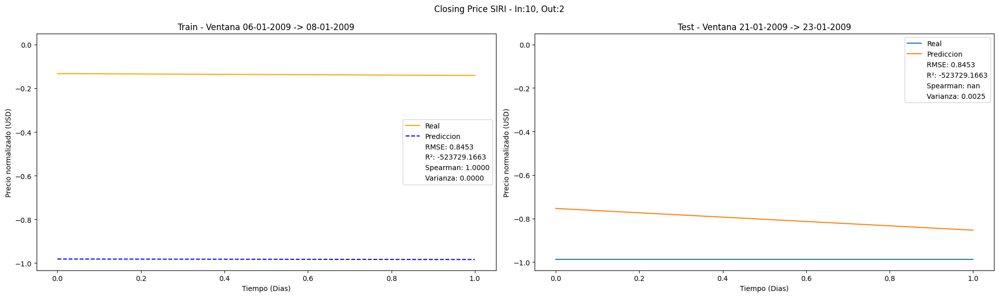

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0946
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0693
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0472
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0278
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0118
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0017
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0015
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0103
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0147
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0113
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0055
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0014
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 4.0573e-05
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 7.0212e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0022
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

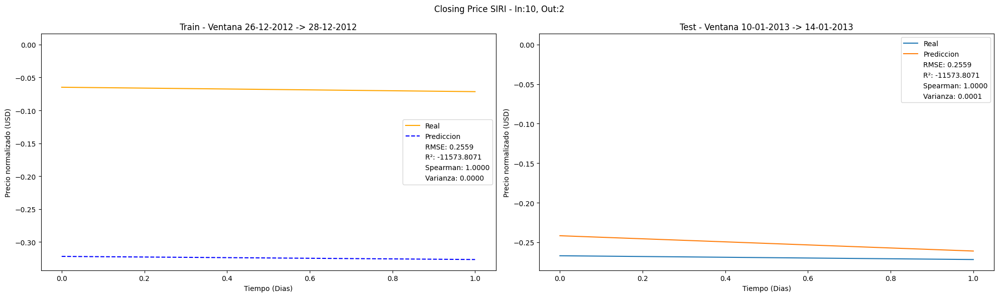

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0077
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0038
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0012
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.5149e-05
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 4.5888e-04
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0013
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0013
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 8.0304e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2.7977e-04
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2.6210e-05
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 2.9361e-05
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 1.7040e-04
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 3.3138e-04
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 4.3763e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 4.6159e-04
Epoch 1

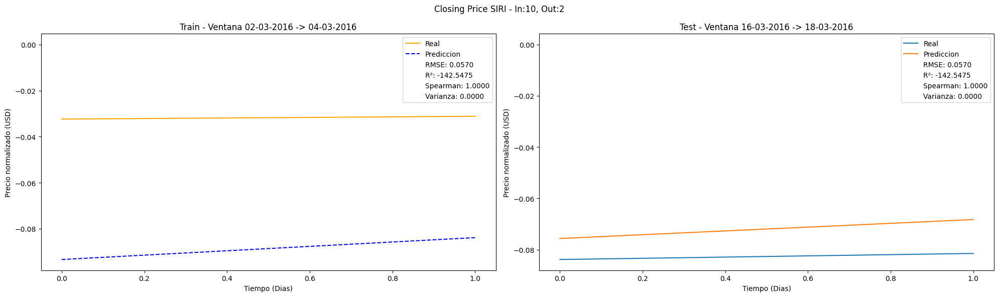

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7945
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.7664
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.7364
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.6986
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.6464
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.5728
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4746
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3661
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2751
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2170
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1820
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1546
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.1274
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1004
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0761
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/s

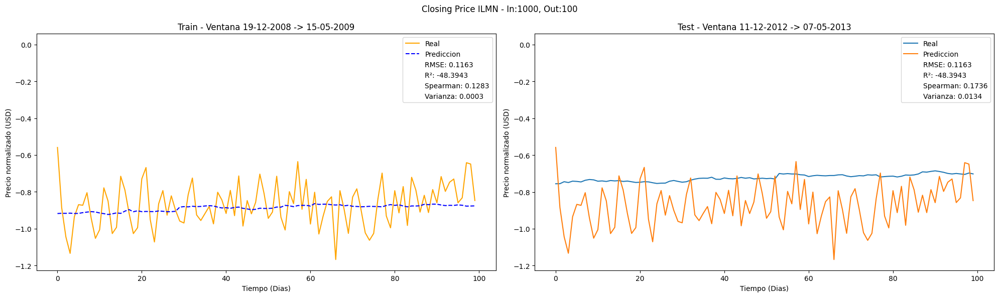

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6548
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.6251
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.5932
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.5527
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.4967
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.4206
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3354
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.2693
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2278
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.1928
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1591
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.1282
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1014
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0787
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0598
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/st

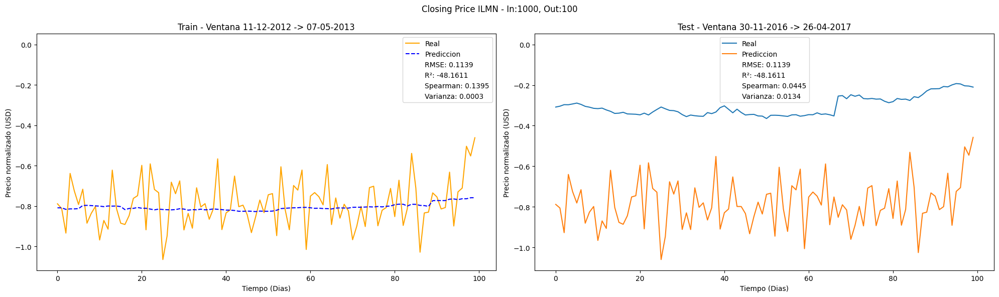

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1758
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1678
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1598
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1507
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1393
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1243
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1042
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0806
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0655
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0612
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0509
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0365
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0253
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0202
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0179
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/s

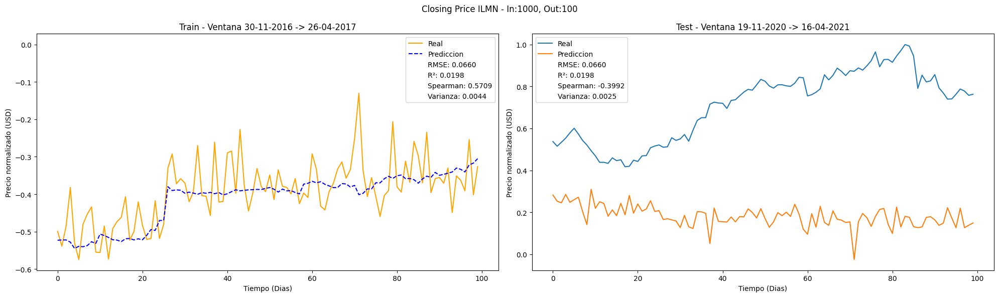

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0541
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0521
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0501
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0478
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0449
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0410
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0358
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0297
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0259
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0242
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0186
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0147
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0128
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0109
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0086
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/st

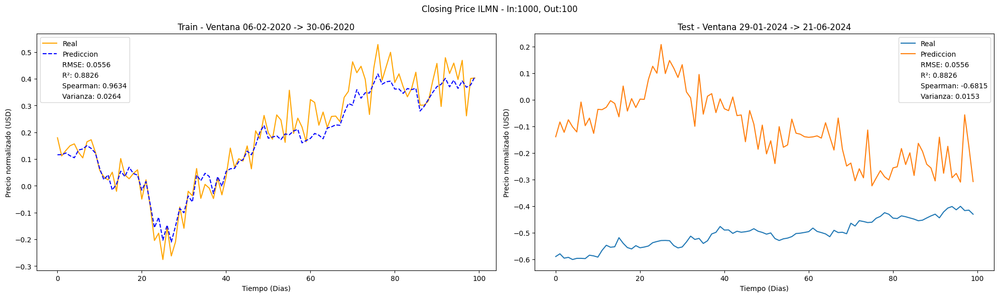

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0081
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.8848
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.7597
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6174
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4477
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2603
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1210
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1015
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1122
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0926
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0603
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0362
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0265
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0264
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0294
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

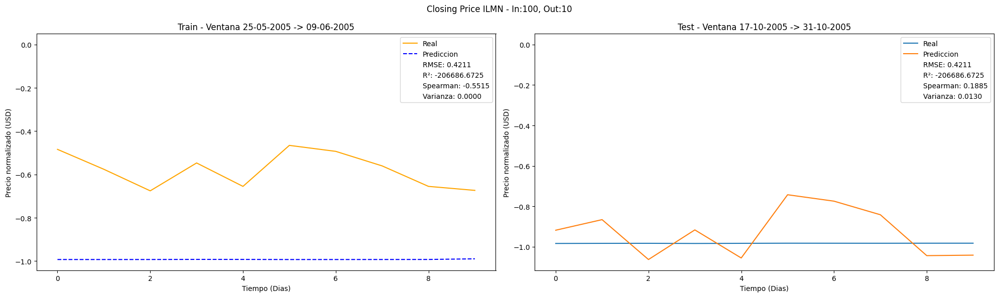

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7865
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.6923
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.6012
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5015
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.3831
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2396
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0900
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0297
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1004
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1092
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0661
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0239
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0071
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0121
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0244
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/st

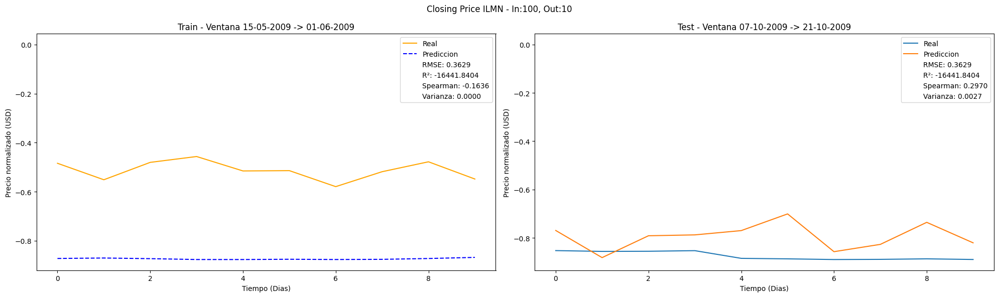

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6040
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.5411
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.4841
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.4253
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.3576
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2739
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1719
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0735
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0559
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0764
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0526
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0208
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0088
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0151
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0261
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/st

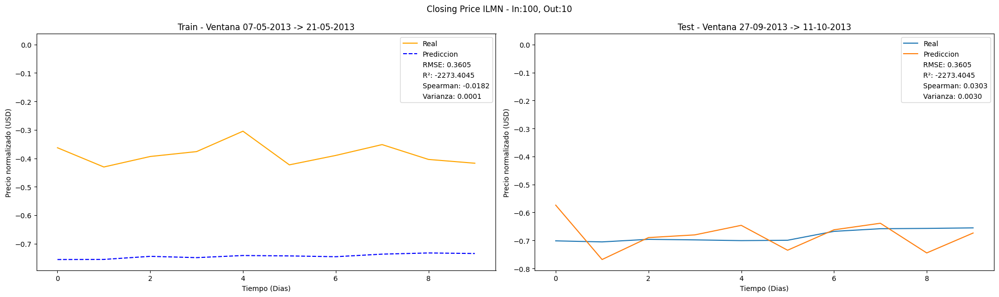

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1841
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1590
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1331
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1040
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0710
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0379
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0233
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0340
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0200
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0045
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0014
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0050
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0087
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0103
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0098
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/st

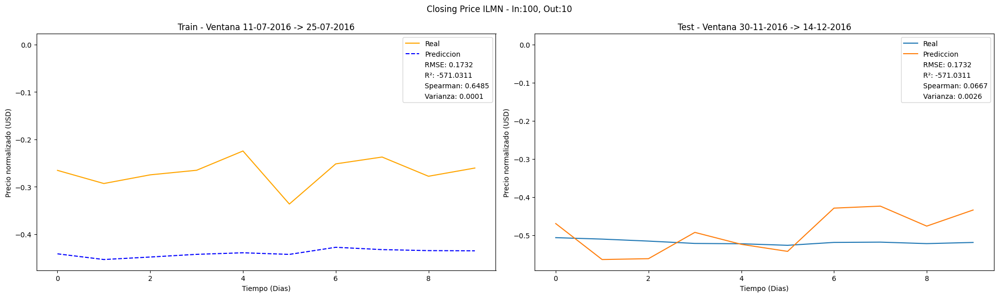

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.0198
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.8552
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.7055
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5636
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4256
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.2913
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1669
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0677
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0209
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0472
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1005
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1104
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0810
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0453
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0232
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/st

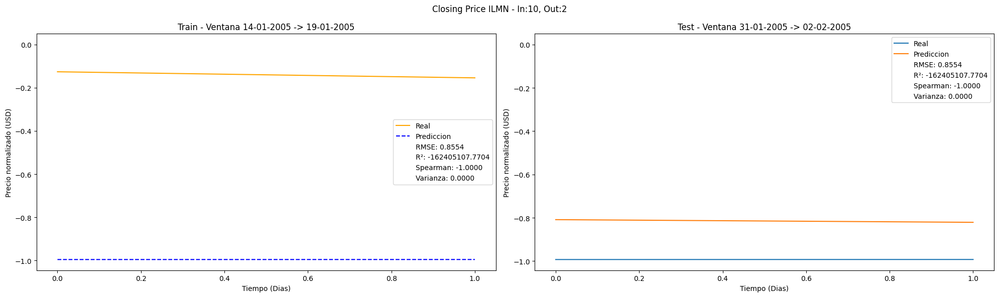

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.8445
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.6861
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.5413
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.4047
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.2743
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1538
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0551
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0023
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0274
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0963
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1130
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0803
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0379
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0101
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0014
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

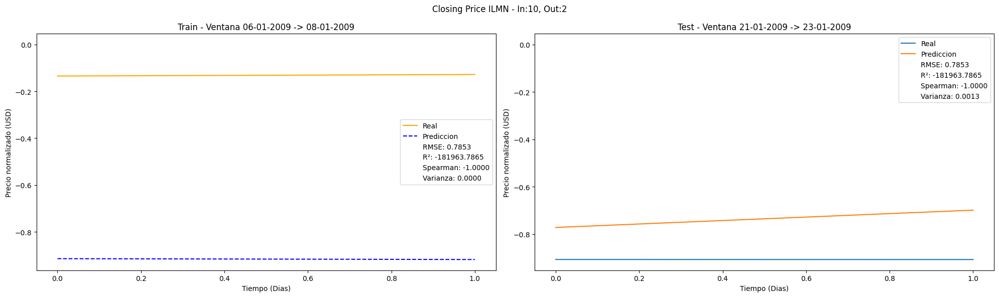

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.7172
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5755
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.4523
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.3400
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2355
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1399
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0598
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0102
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0121
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0593
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0840
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0679
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0373
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0141
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0045
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/st

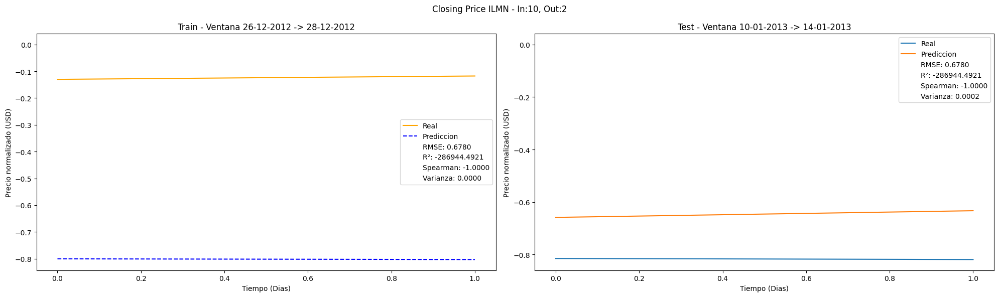

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1781
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1443
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1143
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0864
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0599
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0352
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0143
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0017
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0039
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0177
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0238
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0184
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0097
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0033
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 7.7415e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45m

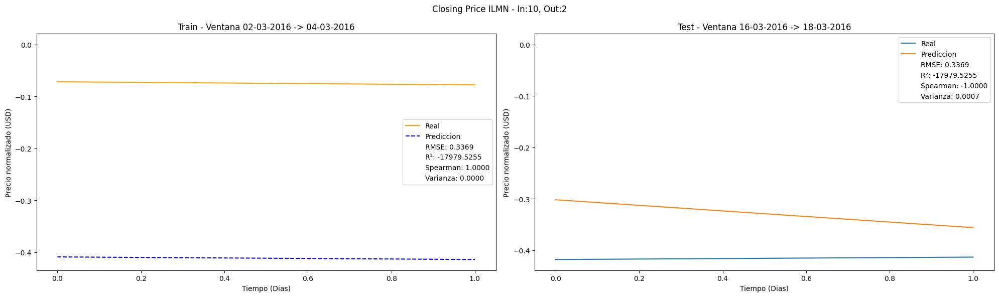

In [13]:
for df,ticker in zip(dataFrames,tickers):
    for n_steps_in, n_steps_out in window_configs:
        for time_step in time_steps:
            #Aseguramos que contamos con suficientes datos para particionar
            if time_step + n_steps_in + n_steps_out > len(df):
                continue

            #Extraemos la secuencia correspondiente a la ventana actual
            seq = df['Close'].iloc[time_step : time_step + n_steps_in + n_steps_out].values

            #Guardamos las fechas inicales y finales que acotan los intervalos
            #utilizados para las predicciones
            date_i_train = df.index[time_step + n_steps_in - 1].strftime('%d-%m-%Y')
            date_f_train = df.index[time_step + n_steps_in + n_steps_out - 1].strftime('%d-%m-%Y')

            date_i_test = df.index[n_steps_in + time_step + n_steps_in - 1].strftime('%d-%m-%Y')
            date_f_test = df.index[n_steps_in + time_step + n_steps_in + n_steps_out - 1].strftime('%d-%m-%Y')

            #Particionamos la secuencia utilizando la funcion split_sequence
            #que devuelve las dos listas correspondientes
            X_train, y_train = split_sequence(seq, n_steps_in, n_steps_out)
            X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

            #Creamos un modelo nuevo para cada configuración
            model = Sequential()
            model.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(n_steps_in, 1)))
            model.add(LSTM(100, activation='tanh'))
            model.add(Dense(n_steps_out))
            model.compile(optimizer='adam', loss='mse')

            #Entrenamos
            history = model.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0)

            #Realizamos la predicción sobre entrenamiento para comparar el
            #ajuste
            y_train_pred = model.predict(y_train, verbose=1)

            #Métricas entrenamiento (global sobre todo el intervalo)
            r2_train = r2_score(y_train.flatten(), y_train_pred.flatten())
            spearmanr_train, _ = spearmanr(y_train.flatten(), y_train_pred.flatten())
            rmse_train = np.sqrt(mean_squared_error(y_train.flatten(), y_train_pred.flatten()))
            var = np.var(y_train.flatten())


            # Graficar pérdida y ajuste sobre entrenamiento
            plt.figure(figsize=(20, 6))
            plt.subplot(1, 2, 1)
            for i in range(min(5, len(y_train))):
                plt.plot(y_train_pred[i], label='Real', linestyle='-', color='orange')
                plt.plot(y_train[i], label='Prediccion', linestyle='--', color='blue')
            plt.suptitle(f'Closing Price {ticker} - In:{n_steps_in}, Out:{n_steps_out}')
            plt.title(f"Train - Ventana {date_i_train} -> {date_f_train}")
            plt.xlabel('Tiempo (Dias)')
            plt.ylabel('Precio normalizado (USD)')
            plt.plot(0, label=f'RMSE: {rmse_train:.4f}', linestyle="")
            plt.plot(0, label=f'R²: {r2_train:.4f}', linestyle="")
            plt.plot(0, label=f'Spearman: {spearmanr_train:.4f}', linestyle="")
            plt.plot(0, label=f'Varianza: {var:.4f}', linestyle="")
            plt.legend()

            #Preparamos la particion de prueba
            start_test = time_step + n_steps_in + n_steps_out
            end_test = start_test + n_steps_in
            if end_test > len(df):
                continue
            X_test = df['Close'].iloc[start_test : end_test].values
            X_test = X_test.reshape((1, n_steps_in, 1))

            y_pred = model.predict(X_test, verbose=1)[0]
            y_real = df['Close'].iloc[end_test : end_test + n_steps_out].values

            #Metricas para la prueba
            if len(y_real) == len(y_pred):
                r2_test = r2_score(y_real, y_pred)
                spearmanr_test, _ = spearmanr(np.squeeze(y_real), y_pred)
                rmse_test = np.sqrt(mean_squared_error(y_real, y_pred))
                var = np.var(y_pred.flatten())
            else:
                r2_test = np.nan
                pearson_test = np.nan
                rmse_test = np.nan

            plt.subplot(1, 2, 2)
            plt.plot(y_real, label='Real')
            plt.plot(y_pred, label='Prediccion')
            plt.title(f'Test - Ventana {date_i_test} -> {date_f_test}')
            plt.xlabel('Tiempo (Dias)')
            plt.ylabel('Precio normalizado (USD)')
            if not np.isnan(rmse_test):
              plt.plot(0, label=f'RMSE: {rmse_train:.4f}', linestyle="")
              plt.plot(0, label=f'R²: {r2_train:.4f}', linestyle="")
              plt.plot(0, label=f'Spearman: {spearmanr_test:.4f}', linestyle="")
              plt.plot(0, label=f'Varianza: {var:.4f}', linestyle="")
            else:
              plt.text(0, 0,'Métricas no disponibles', fontsize=10, verticalalignment='bottom')
            plt.legend()

            plt.tight_layout()
            file_name = f"{ticker}_In{n_steps_in}_Out{n_steps_out}_t{time_step}.png"
            file_path = os.path.join(folder_path, file_name)

            # Guardar el gráfico
            plt.savefig(file_path)
            plt.show()